In [1]:
import zipfile
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import geopy.distance
from matplotlib import cm

In [2]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering
import numpy as np

def plot_dendrogram(model, plot=False, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    order = dendrogram(linkage_matrix, no_plot = not plot, get_leaves=True, **kwargs)['leaves']
    return linkage_matrix, order


def elbow(data):
    elbowdata = np.array(data)
    if elbowdata.shape[1] != 2:
        elbowdata = elbowdata.T
    elbowdata -= elbowdata[0]
    rotation = np.linalg.inv(np.vstack([elbowdata[-1], [-elbowdata[-1,1], elbowdata[-1,0]]]).T)
    idx = np.argmin((elbowdata @rotation.T)[:,1])
    return idx    


def autocluster(data, return_order=False, return_linkage=False, plot=False, **kwargs):
    ag = AgglomerativeClustering(distance_threshold=0,n_clusters=None,**kwargs)
    ag.fit(data)
    linkage_matrix, order = plot_dendrogram(ag)
    idx = len(linkage_matrix) - elbow(list(enumerate(linkage_matrix[:,2])))
    if plot:
        plt.plot(linkage_matrix[:,2][::-1])
        plt.show()
    print("number of clusters: ", idx)
    ag2 = AgglomerativeClustering(n_clusters=idx, **kwargs)
    ag2.fit(data)
    ret = [ag2]
    if return_order:
        ret.append(order)
    if return_linkage:
        ret.append(linkage_matrix)
    return tuple(ret) if len(ret) > 1 else ret[0]

In [3]:
def plot_abq(data, first=True, **kwargs):
    if first:
        print('loading image')
        img = Image.open('abqmap2.png')
        plt.figure(figsize=(10,10))
        plt.imshow(img)
    for row in data:
        if 'latitude' in row:
            plot(row['latitude'], row['longitude'], **kwargs)
        else:
            plot(*row, **kwargs)
    

In [4]:
def plot(lat,lon,c, **kwargs):
    A = np.array([[ 3.30048468e+00, -1.76873312e+03],
       [ 1.44506111e+03, -7.69612341e+00],
       [ 1.54147586e+05,  6.14923771e+04]]).T
    pltx = A[1]@[lat,lon,1]
    plty = A[0]@[lat,lon,1]
    plt.scatter([plty], [pltx], color=c, **kwargs)


In [5]:
with zipfile.ZipFile('../busdata/bus.zip') as file:
    with file.open('bus_data_2022_9_16.csv') as myfile:
        data = myfile.read()

In [6]:
from io import StringIO

df = pd.read_csv(StringIO(data.decode()))
df

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
0,0,601,10:57:24,35.089460,-106.733040,79,0,Off Duty,0,0,No Data,10:57:24,2022-09-16 03:00:38.027739
1,1,606,22:07:50,35.089420,-106.733380,196,0,Off Duty,Undetermined,Undetermined,Depot,19:32:00,2022-09-16 03:00:38.028738
2,2,607,03:00:29,35.089390,-106.733640,184,0,Off Duty,0,0,No Data,03:00:29,2022-09-16 03:00:38.028738
3,3,608,00:35:02,35.089480,-106.734330,129,0,Off Duty,0,0,No Data,00:35:02,2022-09-16 03:00:38.029739
4,4,613,02:51:25,35.089440,-106.733600,358,0,Off Duty,0,0,No Data,02:51:25,2022-09-16 03:00:38.029739
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2345746,2345746,978,07:17:01,35.089289,-106.734490,294,0,Off Duty,0,0,No Data,07:17:01,2022-09-17 03:00:13.785192
2345747,2345747,1521,16:31:53,35.090080,-106.732990,358,0,Off Duty,0,0,No Data,16:31:53,2022-09-17 03:00:13.785192
2345748,2345748,754,17:50:11,35.088731,-106.734191,288,0,Off Duty,0,0,No Data,17:50:11,2022-09-17 03:00:13.786192
2345749,2345749,954,17:49:12,35.088816,-106.734100,162,7,Off Duty,0,0,No Data,17:49:12,2022-09-17 03:00:13.786192


In [7]:
trips = set(df['trip_id'])
len(trips)

1116

In [8]:
trip_routes = pd.read_csv('trips.txt')
route_info = pd.read_csv('routes.txt')
trip_routes

,route_id,service_id,trip_id,trip_headsign,direction_id,block_id,shape_id
0,4178,1,540757,Central & Tramway,0,49096,15085
1,4178,1,540758,Central & Tramway,0,49097,15085
2,4178,1,540759,Central & Tramway,0,49098,15085
3,4178,1,540760,Central & Tramway,0,49096,15085
4,4178,1,540761,Central & Tramway,0,49097,15085
...,...,...,...,...,...,...,...
3908,4216,19,545910,Downtown,1,49495,15231
3909,4216,19,545909,Downtown,1,49495,15231
3910,4216,19,545908,Downtown,1,49495,15231
3911,4216,19,545907,Downtown,1,49495,15231


In [9]:
route777_trips = trip_routes[trip_routes['route_id']==4209]
route777_trips

,route_id,service_id,trip_id,trip_headsign,direction_id,block_id,shape_id
1042,4209,1,544167,Tramway & Central,0,49366,15213
1043,4209,1,544123,Tramway & Central,0,49373,15213
1044,4209,1,544124,Tramway & Central,0,49368,15213
1045,4209,1,544125,Tramway & Central,0,49369,15213
1046,4209,1,544126,Tramway & Central,0,49371,15213
...,...,...,...,...,...,...,...
3786,4209,19,545751,Central & Unser Transit Center,1,49505,15214
3787,4209,19,545750,Central & Unser Transit Center,1,49512,15214
3788,4209,19,545749,Central & Unser Transit Center,1,49511,15214
3789,4209,19,545748,Central & Unser Transit Center,1,49510,15214


In [10]:
onetrip = df[df['trip_id']=='540265']
onetrip

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
1032851,1032851,1923,13:46:23,35.070039,-106.515603,98,31,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:28.230803
1033056,1033056,1923,13:46:31,35.069929,-106.514625,98,18,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:39.998770
1033283,1033283,1923,13:46:39,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:41.405116
1033489,1033489,1923,13:46:47,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:53.038793
1033694,1033694,1923,13:46:55,35.069885,-106.514246,97,5,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:59.716897
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1127467,1127467,1923,14:46:23,35.081084,-106.705427,255,38,777,540265,704230844,ART - West Central Station,14:48:48,2022-09-16 14:46:32.745520
1127674,1127674,1923,14:46:39,35.080526,-106.707996,255,31,777,540265,704230844,ART - West Central Station,14:48:48,2022-09-16 14:46:44.958367
1127880,1127880,1923,14:46:47,35.080279,-106.709068,254,25,777,540265,704230844,ART - West Central Station,14:48:48,2022-09-16 14:46:51.185619
1128108,1128108,1923,14:46:39,35.080526,-106.707996,255,31,777,540265,704230844,ART - West Central Station,14:48:48,2022-09-16 14:46:54.913898


448it [00:01, 238.69it/s]


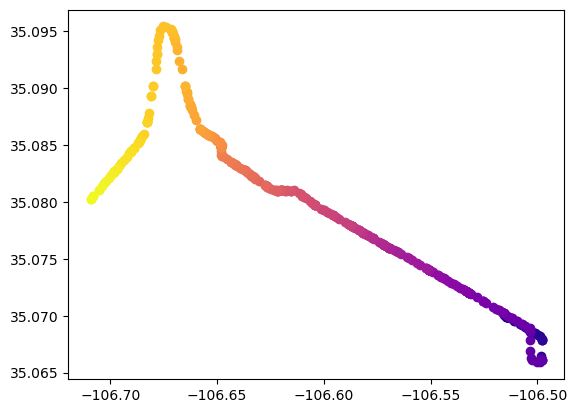

In [11]:

for i,(_,row) in enumerate(tqdm(onetrip.iterrows())):
    plt.scatter([row['longitude']], [row['latitude']], color=cm.plasma(i/len(onetrip)))
plt.show()

448it [00:01, 267.63it/s]


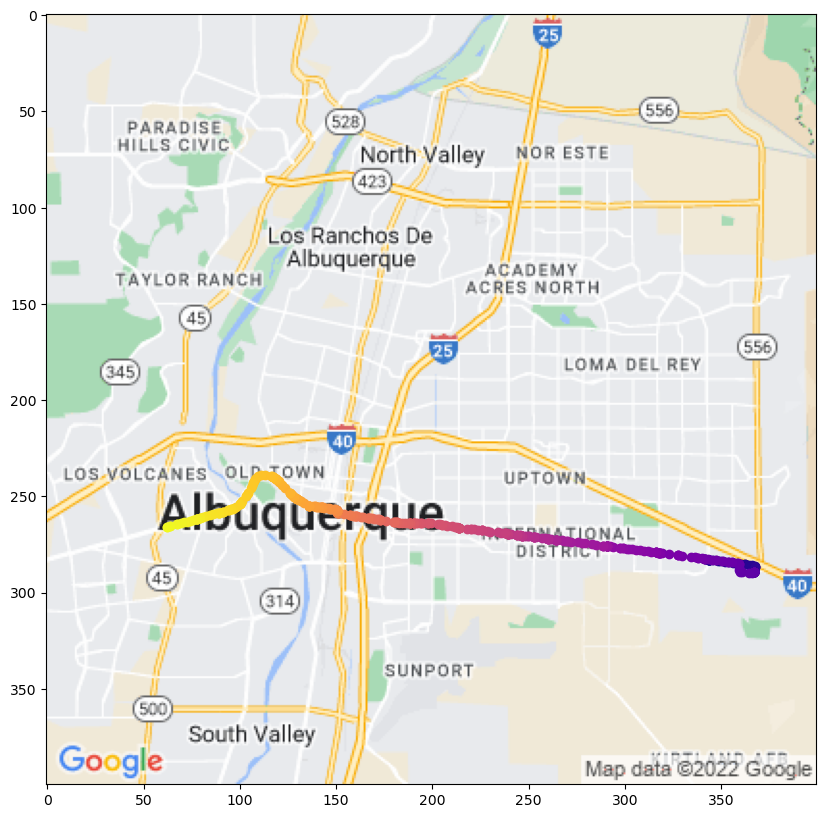

In [12]:
img = Image.open('abqmap2.png')
plt.figure(figsize=(10,10))
plt.imshow(img)
for i,(_,row) in enumerate(tqdm(onetrip.iterrows())):
    plot(row['latitude'], row['longitude'], cm.plasma(i/len(onetrip)))
plt.show()

In [13]:
def str2time(s):
    hour,minute,second = list(map(int,s.split(':')))
    return second + 60*minute + 60*60*hour

In [14]:
onetrip2 = onetrip.sort_values('msg_time', key=lambda x: [str2time(y) for y in x]).drop_duplicates('msg_time')
pd.set_option('display.max_rows', 1000)
onetrip2

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
1032851,1032851,1923,13:46:23,35.070039,-106.515603,98,31,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:28.230803
1033056,1033056,1923,13:46:31,35.069929,-106.514625,98,18,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:39.998770
1033283,1033283,1923,13:46:39,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:41.405116
1033489,1033489,1923,13:46:47,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:53.038793
1033694,1033694,1923,13:46:55,35.069885,-106.514246,97,5,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:59.716897
1033921,1033921,1923,13:47:03,35.069848,-106.513820,97,16,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:04.831553
1034127,1034127,1923,13:47:11,35.069756,-106.512966,97,26,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:16.564610
1034559,1034559,1923,13:47:27,35.069560,-106.510924,98,20,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:28.726288
1034991,1034991,1923,13:47:35,35.069495,-106.510313,98,16,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:41.970415
1035197,1035197,1923,13:47:51,35.069277,-106.508339,98,31,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:53.717290


In [15]:


dists = []
times = []
speeds = []
lastrow = None
first_stop = True
for _,row in onetrip.sort_values('msg_time', key=lambda x: [str2time(y) for y in x]).iterrows():
    if lastrow is None:
        lastrow = row
        continue
    if row['next_stop_id'] != lastrow['next_stop_id']:
        first_stop = False
    if not first_stop:
        dists.append(geopy.distance.geodesic([lastrow['latitude'], lastrow['longitude']], [row['latitude'],row['longitude']]).feet)
        times.append(str2time(row['msg_time']) - str2time(lastrow['msg_time']))
        speeds.append(row['speed_mph'])
    lastrow=row


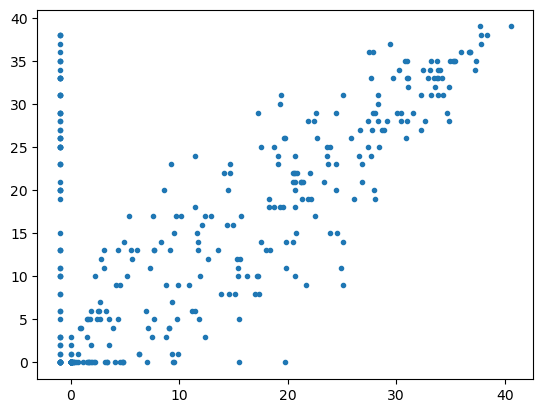

In [16]:
plt.plot([ d*3600/(t*5280) if t > 0 else -1 for d,t in zip(dists, times) ], speeds, '.')
plt.show()

(array([183.,  44.,  52.,  32.,  31.,   4.,  16.,   4.,   8.,   2.]),
 array([  0.        ,  95.19622993, 190.39245987, 285.5886898 ,
        380.78491974, 475.98114967, 571.17737961, 666.37360954,
        761.56983947, 856.76606941, 951.96229934]),
 <BarContainer object of 10 artists>)

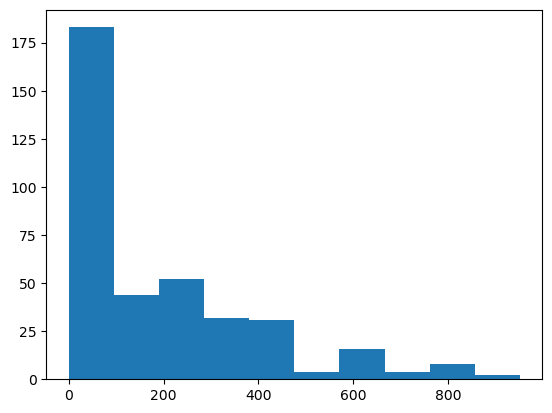

In [17]:
plt.hist(dists)

(array([ 76.,   0., 224.,   0.,   0.,  71.,   0.,   4.,   0.,   1.]),
 array([ 0. ,  3.2,  6.4,  9.6, 12.8, 16. , 19.2, 22.4, 25.6, 28.8, 32. ]),
 <BarContainer object of 10 artists>)

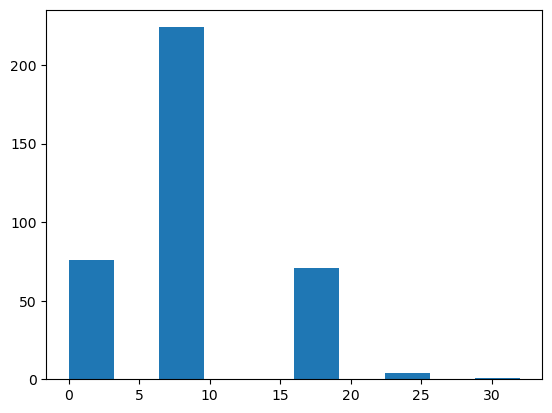

In [18]:
plt.hist(times)

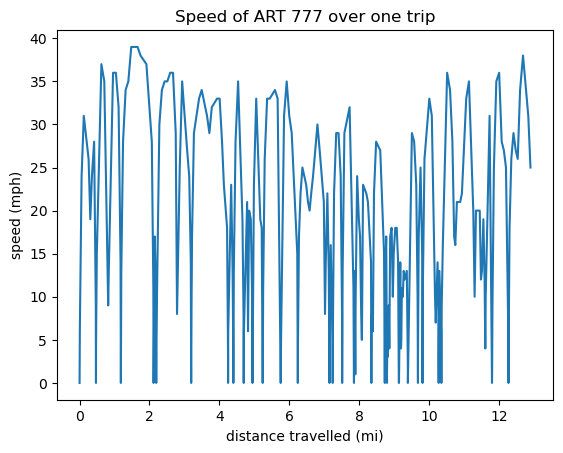

In [19]:
plt.plot(np.cumsum(dists)/5280, speeds)
plt.ylabel('speed (mph)')
plt.xlabel('distance travelled (mi)')
plt.title('Speed of ART 777 over one trip')
plt.show()

In [20]:
# good
stopped = onetrip[onetrip['speed_mph']==0]
stopped

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
1033283,1033283,1923,13:46:39,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:41.405116
1033489,1033489,1923,13:46:47,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:53.038793
1037336,1037336,1923,13:49:03,35.067988,-106.497875,161,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:49:07.497206
1038612,1038612,1923,13:49:51,35.066224,-106.498073,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:49:56.378310
1038818,1038818,1923,13:50:07,35.066224,-106.498073,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:11.311527
1039024,1039024,1923,13:49:51,35.066224,-106.498073,188,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:12.767548
1039250,1039250,1923,13:50:15,35.066224,-106.498073,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:22.424021
1039456,1039456,1923,13:50:23,35.066226,-106.498077,188,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:34.628576
1039682,1039682,1923,13:50:31,35.066226,-106.498077,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:36.135641
1039888,1039888,1923,13:50:39,35.066226,-106.498077,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:47.645445


129it [00:00, 304.07it/s]


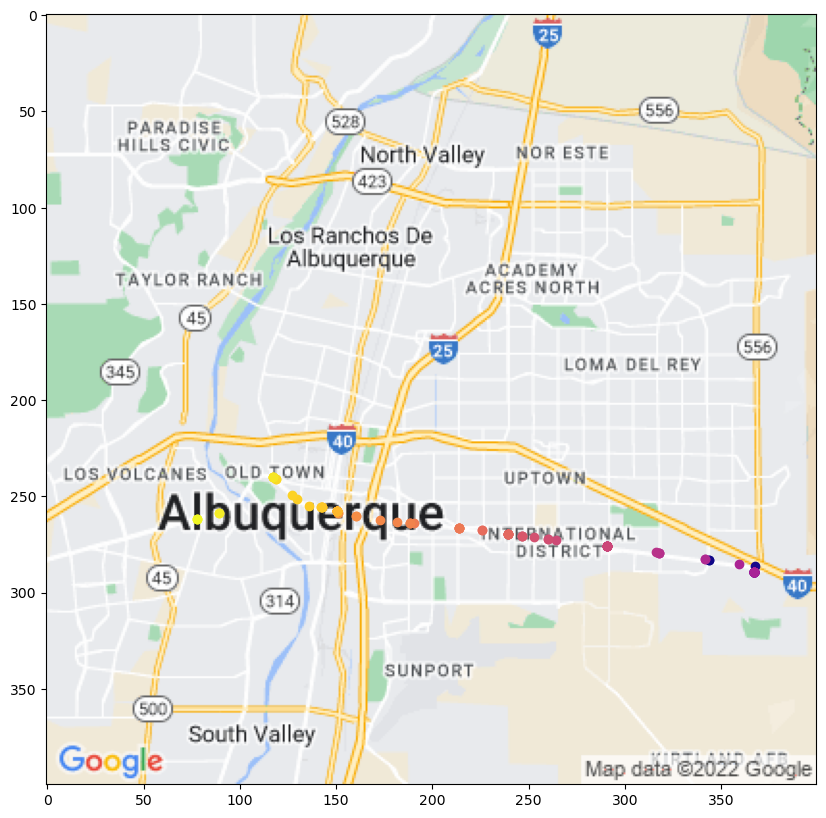

In [21]:
img = Image.open('abqmap2.png')
plt.figure(figsize=(10,10))
plt.imshow(img)
for i,(_,row) in enumerate(tqdm(stopped.iterrows())):
    plot(row['latitude'], row['longitude'], cm.plasma(i/len(stopped)))
plt.show()

# How bad are the stops?

448it [00:01, 260.75it/s]


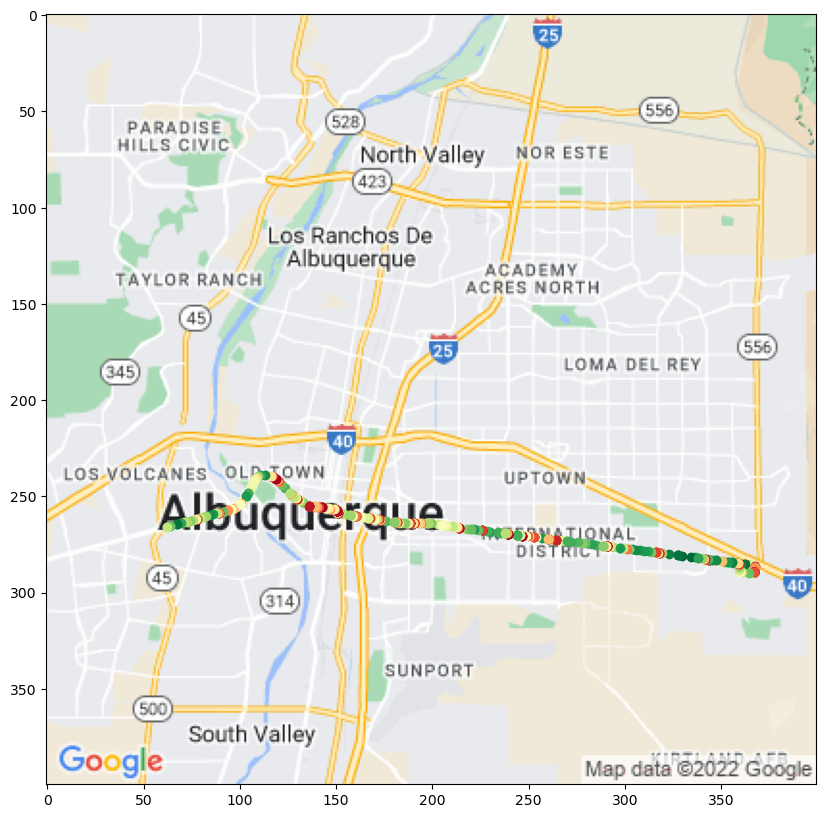

In [22]:
img = Image.open('abqmap2.png')
plt.figure(figsize=(10,10))
plt.imshow(img)
for i,(_,row) in enumerate(tqdm(onetrip.iterrows())):
    plot(row['latitude'], row['longitude'], cm.RdYlGn(row['speed_mph']/onetrip['speed_mph'].max()))
plt.show()

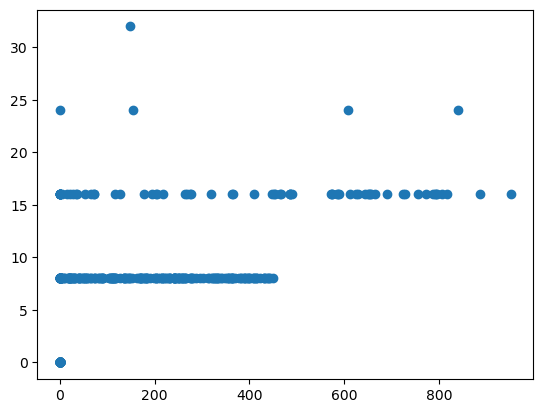

In [23]:
plt.scatter(dists, times)

In [24]:
adj_dists = [d for t,d in zip(times, dists) if t > 0]
adj_times = [t for t,d in zip(times, dists) if t > 0]
adj_speeds = [s for t,s in zip(times, speeds) if t > 0]

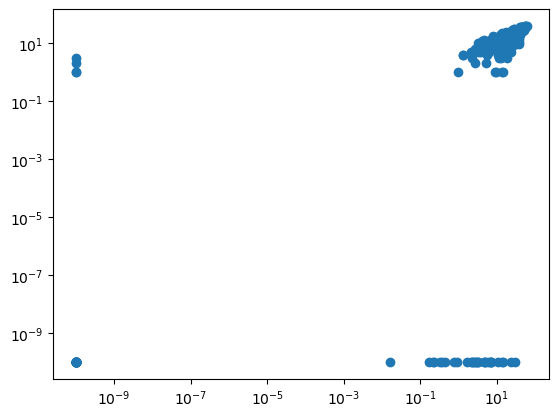

In [25]:
plt.scatter([max(d/t,1e-10) for d,t in zip(adj_dists, adj_times)], np.maximum(adj_speeds,1e-10))
plt.xscale('log')
plt.yscale('log')
plt.show()


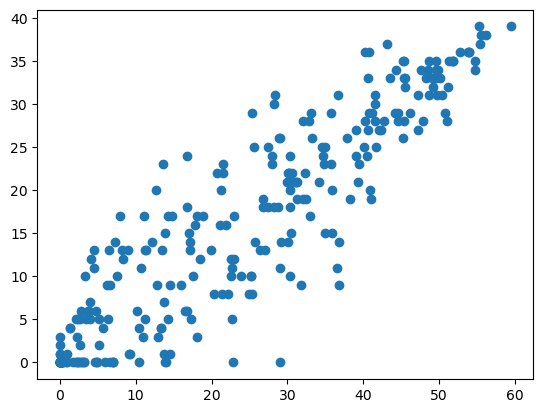

In [26]:
plt.scatter([max(d/t,1e-10) for d,t in zip(adj_dists, adj_times)], np.maximum(adj_speeds,1e-10))
plt.show()


In [27]:
comp_speeds = [d*3600/(t*5280) for d,t in zip(adj_dists, adj_times)]

In [28]:
# img = Image.open('abqmap2.png')
# plt.figure(figsize=(10,10))
# plt.imshow(img)
# last_speed = -1
# ctr = 0
# for i,(_,row) in enumerate(tqdm(onetrip.iterrows())):
#     if i==0 or times[i-1] == 0:
#         continue
#     plot(row['latitude'], row['longitude'], cm.RdYlGn((comp_speeds[ctr]/max(comp_speeds))))
#     ctr += 1
# plt.show()

Time spent travelling slower than 12.0 minutes/mile: 16.4
Time spent travelling slower than 3.0 minutes/mile: 31.333333333333332
Time spent travelling slower than 1.5 minutes/mile: 50.666666666666664


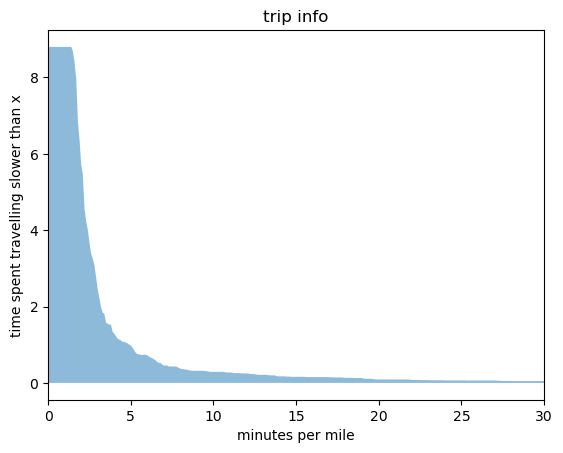

In [29]:
# I should have made this function a long time ago
def area(t, curve, x):
    return np.mean(curve[x>t])*(x.max()-t)

def speed_curve(distance, speed, time, min_speed=1e-2):
    if type(distance) is not np.ndarray:
        distance= np.array(distance)
    if type(speed) is not np.ndarray:
        speed = np.array(speed)
    if type(time) is not np.ndarray:
        time = np.array(time)
    speed = np.maximum(speed, min_speed)
    distance = speed*time
    laptimes = 60/speed
    speed_points = np.linspace(0,laptimes.max(),int(laptimes.max())*10)[:-1]
    curve = np.array([distance[laptimes > x].sum()/5280 for x in speed_points])
    ts = np.linspace(0,speed_points.max()**0.2,1000)[:-1]**5
    
    plt.title("trip info")
    plt.fill_between(speed_points, np.zeros(len(speed_points)), curve, alpha=0.5)
    plt.xlabel("minutes per mile")
    plt.ylabel("time spent travelling slower than x")
    for s in [5,20,40]:
        t = 60/s
        print(f"Time spent travelling slower than {t} minutes/mile: {time[laptimes>t].sum()/60}")
    plt.xlim(0,30)
    plt.show()


speed_curve(adj_dists, comp_speeds, adj_times)


100%|████████████████| 59999/59999 [00:00<00:00, 108316.99it/s]
C:\Users\patri\AppData\Local\Temp\ipykernel_25704\3492816513.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(["%.2E" % int(x_u[i]) if x_u[i] > 100 else str(int(x_u[i])) for i in range(0,len(x_u),len(x_u)//(n_labels-1))])


Time spent travelling slower than 12.0 minutes/mile: 16.4
Time spent travelling slower than 3.0 minutes/mile: 31.333333333333332
Time spent travelling slower than 1.5 minutes/mile: 50.666666666666664


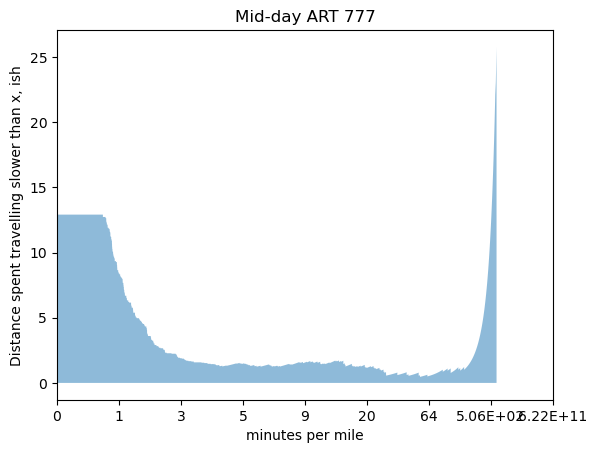

In [30]:

def speed_curve_adj(distance, speed, time, min_speed=1e-2):
    if type(distance) is not np.ndarray:
        distance= np.array(distance)
    if type(speed) is not np.ndarray:
        speed = np.array(speed)
    if type(time) is not np.ndarray:
        time = np.array(time)
    speed = np.maximum(speed, min_speed)
    distance = speed*(time/3600)
    laptimes = 60/speed
    speed_points = np.linspace(0,laptimes.max(),int(laptimes.max())*10)[:-1]
    curve = np.array([distance[laptimes > x].sum() for x in speed_points])
    ts = np.linspace(0,speed_points.max()**0.2,1000)[:-1]**5

    pivot = 5
    asymp = 15
    p=3
    u = np.linspace(0,asymp,len(speed_points)+1)[:-1]
    x_u = u.copy()
    du = np.ones(len(u))
    
    x_u[u>pivot] = (asymp - pivot)**(p+1) / (p*(asymp - u[u>pivot])**p) - (asymp - pivot)/p + pivot
    du[u>pivot] = (asymp - pivot)**(p+1) / (asymp - u[u>pivot])**(p+1)
    curve_u = np.array([du_i * distance[laptimes > ui].sum() for ui, du_i in zip(tqdm(x_u), du)])
    fig, ax = plt.subplots()
    plt.title("Mid-day ART 777")
    plt.fill_between(u, np.zeros(len(u)), curve_u, alpha=0.5)
    plt.xlabel("minutes per mile")
    plt.ylabel("Distance spent travelling slower than x, ish")
    for s in [5,20,40]:
        t = 60/s
        print(f"Time spent travelling slower than {t} minutes/mile: {time[laptimes>t].sum()/60}")
    plt.xlim(0,asymp+1)
    
    n_labels = len(ax.get_xticklabels())
    
    ax.set_xticklabels(["%.2E" % int(x_u[i]) if x_u[i] > 100 else str(int(x_u[i])) for i in range(0,len(x_u),len(x_u)//(n_labels-1))])    
    plt.show()
#     pivot = 5

speed_curve_adj(adj_dists, comp_speeds, adj_times)

100%|████████████████| 59999/59999 [00:00<00:00, 102779.87it/s]


Area of segment 0:  20.720711638597475
Area of segment 1:  3.6078211184665783
Area of segment 2:  1.3541278818203129
Area of segment 3:  1.6033739519175896
Area of segment 4:  7.440598213047457
Time spent travelling slower than 12.0 minutes/mile: 16.4
Time spent travelling slower than 3.0 minutes/mile: 31.333333333333332
Time spent travelling slower than 1.5 minutes/mile: 50.666666666666664
Time spent travelling slower than 0.0 minutes/mile: 50.93333333333333


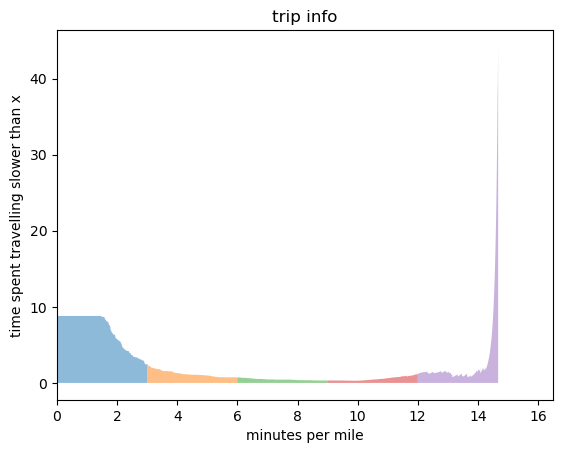

In [31]:

def speed_curve_adj2(distance, speed, time, min_speed=1e-2):
    if type(distance) is not np.ndarray:
        distance= np.array(distance)
    if type(speed) is not np.ndarray:
        speed = np.array(speed)
    if type(time) is not np.ndarray:
        time = np.array(time)
    speed = np.maximum(speed, min_speed)
    distance = speed*time
    laptimes = 60/speed
    speed_points = np.linspace(0,laptimes.max(),int(laptimes.max())*10)[:-1]
    curve = np.array([distance[laptimes > x].sum()/5280 for x in speed_points])
    ts = np.linspace(0,speed_points.max()**0.2,1000)[:-1]**5

    pivot = 10
    asymp = 15
    p=3
    u = np.linspace(0,asymp,len(speed_points)+1)[:-1]
    x_u = u.copy()
    du = np.ones(len(u))
    
    x_u[u>pivot] = (asymp - pivot)**(p+1) / (p*(asymp - u[u>pivot])**p) - (asymp - pivot)/p + pivot
    du[u>pivot] = (asymp - pivot)**(p+1) / (asymp - u[u>pivot])**(p+1)
    curve_u = np.array([du_i * distance[laptimes > ui].sum()/5280 for ui, du_i in zip(tqdm(x_u), du)])

    plt.title("trip info")
    divisions = 5
    for i in range(divisions):
        a =(i* len(u))//divisions
        b = ((i+1) * len(u)) // divisions
        plt.fill_between(u[a:b], np.zeros(len(u[a:b])), curve_u[a:b], alpha=0.5)
        print(f'Area of segment {i}: ', area(u[a], curve_u, u) - area(u[min(b,len(u)-2)], curve_u, u))
    plt.xlabel("minutes per mile")
    plt.ylabel("time spent travelling slower than x")
    for s in [5,20,40,np.inf]:
        t = 60/s
        print(f"Time spent travelling slower than {t} minutes/mile: {time[laptimes>t].sum()/60}")
    plt.xlim(0,asymp*1.1)
    plt.show()
    pivot = 5

speed_curve_adj2(adj_dists, comp_speeds, adj_times)

100%|█████████████████| 59999/59999 [00:00<00:00, 97134.62it/s]


Area of segment 0:  20.720711638597475
Area of segment 1:  3.6078211184665783
Area of segment 2:  1.3541278818203129
Area of segment 3:  1.6033739519175896
Area of segment 4:  7.440598213047457
Time spent travelling slower than 12.0 minutes/mile: 16.4
Time spent travelling slower than 3.0 minutes/mile: 31.333333333333332
Time spent travelling slower than 1.5 minutes/mile: 50.666666666666664
Time spent travelling slower than 0.0 minutes/mile: 50.93333333333333


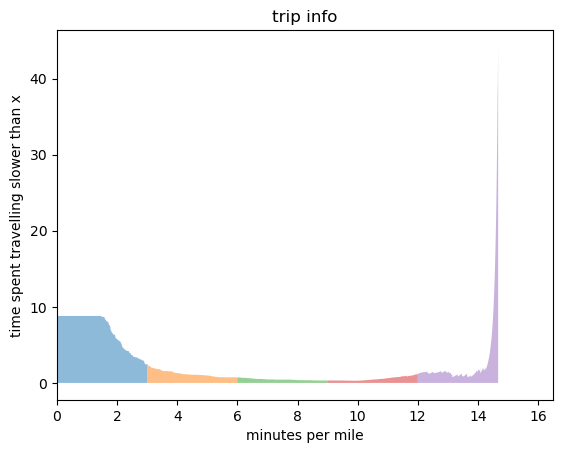

In [32]:
distance = adj_dists
speed = comp_speeds
time = adj_times
min_speed = 1e-2
# def speed_curve_adj2(distance, speed, time, min_speed=1e-2):
if type(distance) is not np.ndarray:
    distance= np.array(distance)
if type(speed) is not np.ndarray:
    speed = np.array(speed)
if type(time) is not np.ndarray:
    time = np.array(time)
speed = np.maximum(speed, min_speed)
distance = speed*time
laptimes = 60/speed
speed_points = np.linspace(0,laptimes.max(),int(laptimes.max())*10)[:-1]
curve = np.array([distance[laptimes > x].sum()/5280 for x in speed_points])
ts = np.linspace(0,speed_points.max()**0.2,1000)[:-1]**5

pivot = 10
asymp = 15
p=3
u = np.linspace(0,asymp,len(speed_points)+1)[:-1]
x_u = u.copy()
du = np.ones(len(u))

x_u[u>pivot] = (asymp - pivot)**(p+1) / (p*(asymp - u[u>pivot])**p) - (asymp - pivot)/p + pivot
du[u>pivot] = (asymp - pivot)**(p+1) / (asymp - u[u>pivot])**(p+1)
curve_u = np.array([du_i * distance[laptimes > ui].sum()/5280 for ui, du_i in zip(tqdm(x_u), du)])

plt.title("trip info")
divisions = 5
for i in range(divisions):
    a =(i* len(u))//divisions
    b = ((i+1) * len(u)) // divisions
    plt.fill_between(u[a:b], np.zeros(len(u[a:b])), curve_u[a:b], alpha=0.5)
    print(f'Area of segment {i}: ', area(u[a], curve_u, u) - area(u[min(b,len(u)-2)], curve_u, u))
plt.xlabel("minutes per mile")
plt.ylabel("time spent travelling slower than x")
for s in [5,20,40,np.inf]:
    t = 60/s
    print(f"Time spent travelling slower than {t} minutes/mile: {time[laptimes>t].sum()/60}")
plt.xlim(0,asymp*1.1)
plt.show()
pivot = 5

# speed_curve_adj2(adj_dists, comp_speeds, adj_times)

# How many times did this ART stop?

In [33]:
stop_locations = np.array([ (row['latitude'], row['longitude']) for _,row in stopped.iterrows()])
stop_locations.shape

(129, 2)

In [34]:
#
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering
import numpy as np

# def plot_dendrogram(model, plot=False, **kwargs):
#     # Create linkage matrix and then plot the dendrogram

#     # create the counts of samples under each node
#     counts = np.zeros(model.children_.shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1  # leaf node
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count

#     linkage_matrix = np.column_stack([model.children_, model.distances_,
#                                       counts]).astype(float)

#     # Plot the corresponding dendrogram
#     if plot:
# #         dendrogram(linkage_matrix, **kwargs)
#         plt.plot(linkage_matrix[:,2])
#         plt.show()
#     return linkage_matrix


# def elbow(data):
#     elbowdata = np.array(data)
#     if elbowdata.shape[1] != 2:
#         elbowdata = elbowdata.T
#     elbowdata -= elbowdata[0]
#     rotation = np.linalg.inv(np.vstack([elbowdata[-1], [-elbowdata[-1,1], elbowdata[-1,0]]]).T)
#     idx = np.argmin((elbowdata @rotation.T)[:,1])
#     return idx    


# def autocluster(data, plot=False):
#     ag = AgglomerativeClustering(distance_threshold=0,n_clusters=None)
#     ag.fit(data)
#     linkage_matrix = plot_dendrogram(ag, plot)
#     idx = elbow(list(enumerate(linkage_matrix[:,2])))
#     idx = len(data) - idx
#     print("number of clusters: ", idx)
#     ag2 = AgglomerativeClustering(n_clusters=idx)
#     ag2.fit(data)
#     return ag2, linkage_matrix

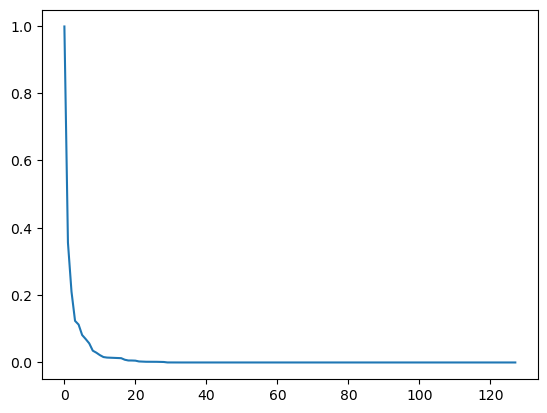

number of clusters:  9


In [35]:
_, lmat = autocluster(stop_locations, return_linkage=True, plot=True)

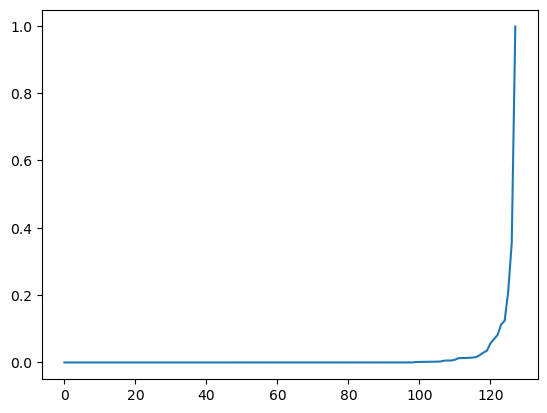

In [36]:
plt.plot(lmat[:,2])

In [37]:
# Ok, how many individual times of "stopped" are there
stopped_insts = 0
am_stopped = False
for s in speeds:
    if s < 5:
        if not am_stopped:
            stopped_insts += 1
        am_stopped = True
    else:
        am_stopped = False
print(stopped_insts)

32


23
552


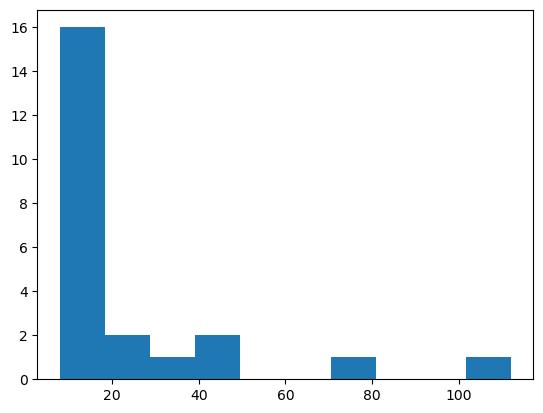

In [38]:
# Ok, how many individual times of "stopped" are there
stopped_insts = []
stopped_stops = []
am_stopped = False
for s,t in zip(comp_speeds,adj_times):
    if s <= 1:
        if not am_stopped:
            stopped_insts.append(0)
        am_stopped = True
        stopped_insts[-1] += t
    else:
        am_stopped = False
print(len(stopped_insts))
print(sum(stopped_insts))
plt.hist(stopped_insts)
plt.show()

In [39]:
stopped_insts

[16,
 8,
 24,
 80,
 16,
 16,
 16,
 40,
 8,
 32,
 16,
 16,
 8,
 8,
 8,
 112,
 16,
 8,
 16,
 8,
 16,
 24,
 40]

In [40]:
len(set(onetrip['next_stop_name']))

22

In [41]:
onetrip.sort_values('msg_time', key=lambda x: [str2time(y) for y in x])

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
1032851,1032851,1923,13:46:23,35.070039,-106.515603,98,31,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:28.230803
1033056,1033056,1923,13:46:31,35.069929,-106.514625,98,18,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:39.998770
1033283,1033283,1923,13:46:39,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:41.405116
1033489,1033489,1923,13:46:47,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:53.038793
1033694,1033694,1923,13:46:55,35.069885,-106.514246,97,5,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:59.716897
1034332,1034332,1923,13:46:55,35.069885,-106.514246,97,5,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:17.985889
1034764,1034764,1923,13:46:55,35.069885,-106.514246,97,5,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:37.900939
1035402,1035402,1923,13:46:55,35.069885,-106.514246,97,5,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:56.381660
1033921,1033921,1923,13:47:03,35.069848,-106.513820,97,16,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:04.831553
1034127,1034127,1923,13:47:11,35.069756,-106.512966,97,26,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:47:16.564610


In [42]:
stopped.sort_values('msg_time', key=lambda x: [str2time(y) for y in x])

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
1033283,1033283,1923,13:46:39,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:41.405116
1033489,1033489,1923,13:46:47,35.069888,-106.514315,98,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:46:53.038793
1037336,1037336,1923,13:49:03,35.067988,-106.497875,161,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:49:07.497206
1038612,1038612,1923,13:49:51,35.066224,-106.498073,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:49:56.378310
1039024,1039024,1923,13:49:51,35.066224,-106.498073,188,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:12.767548
1038818,1038818,1923,13:50:07,35.066224,-106.498073,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:11.311527
1039250,1039250,1923,13:50:15,35.066224,-106.498073,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:22.424021
1039456,1039456,1923,13:50:23,35.066226,-106.498077,188,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:34.628576
1039682,1039682,1923,13:50:31,35.066226,-106.498077,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:36.135641
1039888,1039888,1923,13:50:39,35.066226,-106.498077,163,0,777,540265,704230162,Tramway @ Wenonah (ART),13:56:00,2022-09-16 13:50:47.645445


# Ok, let's look at all of them

In [43]:
route777_trips = df[df['route_short_name']=='777']

In [44]:
import json
with open('stoplocations.json') as file:
    stoplocations = json.load(file)

art777_stops = set(route777_trips['next_stop_id'])
art777_locations = np.array([[stoplocations[t]['lat'], stoplocations[t]['lng']] for t in art777_stops])

In [45]:
arts = set(route777_trips['trip_id'])
# Ok, I need to filter to only trips that go on the base route
locations = []
for tid in tqdm(arts):
    trip = route777_trips[route777_trips['trip_id']==tid].sort_values('msg_time', key=lambda x: [str2time(y) for y in x])
    for _,row in trip.iterrows():
        locations.append((row['latitude'], row['longitude']))
locations = np.array(locations)
print(locations.shape)

100%|████████████████████████| 115/115 [00:05<00:00, 20.78it/s]

(43461, 2)


In [46]:
def trip2array(trip, n):
    locations = np.zeros((n,2))
    msg_times = np.array([str2time(t) for t in trip['msg_time']])
    for i,t in zip(range(n), np.linspace(min(msg_times),max(msg_times),n, endpoint=False)):
        x = np.argmax(msg_times > t)
        locations[i] = ((trip['latitude'].iloc[x] + trip['latitude'].iloc[x-1])/2, (trip['longitude'].iloc[x] + trip['longitude'].iloc[x-1])/2)
    return locations

In [47]:
trip_arrays = []
for tid in tqdm(arts):
        trip = route777_trips[route777_trips['trip_id']==tid].sort_values('msg_time', key=lambda x: [str2time(y) for y in x])
        trip_arrays.append(trip2array(trip,100))
trip_arrays = np.array(trip_arrays)

100%|████████████████████████| 115/115 [00:02<00:00, 47.86it/s]


C:\Users\patri\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


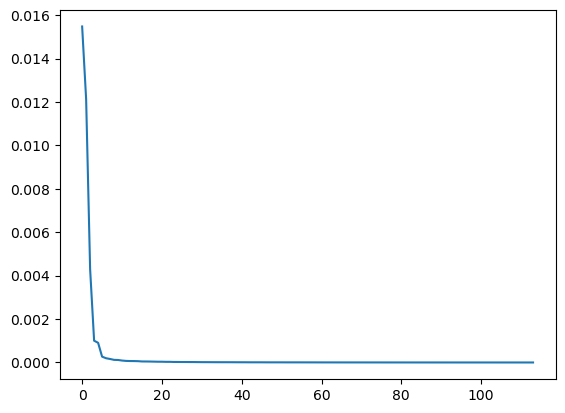

number of clusters:  6


C:\Users\patri\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


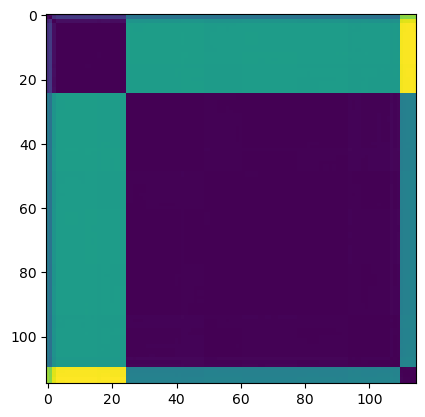

In [48]:
from scipy.stats import kendalltau
dist_mat = np.zeros((len(trip_arrays),len(trip_arrays)))
for i,t1 in enumerate(trip_arrays):
    for j,t2 in enumerate(trip_arrays[i+1:]):
        dist_mat[i,i+j+1] = abs(t1[:,0].max() - t2[:,0].max())
#         dist_mat[i,i+j+1] = kendalltau(t1[:,0],t2[:,0])[1] + kendalltau(t1[:,1],t2[:,1])[1]
#         dist_mat[i,i+j+1] = (1-kendalltau(t1[:,0],t2[:,0])[0]) * (1-kendalltau(t1[:,1],t2[:,1])[0])
#         x = ((t - np.mean(t,axis=0))*(t2 - np.mean(t2,axis=0))).sum(0)
#         y,z = np.linalg.norm((t - np.mean(t,axis=0)), axis=0),np.linalg.norm((t2 - np.mean(t2,axis=0)), axis=0)
#         dist_mat[i,i+j+1] = 1-x[0]*x[1]/(y[0]*y[1]*z[0]*z[1])
dist_mat += dist_mat.T
# .square( trip_arrays[:,None] - trip_arrays[None]).sum(-1).max(-1)**0.5
ag, lmat = autocluster(dist_mat, return_order=True, plot=True, affinity="precomputed", linkage='average')
order = lmat#['leaves']
plt.imshow(dist_mat[order][:,order])
plt.show()

In [49]:
order = lmat#['leaves']

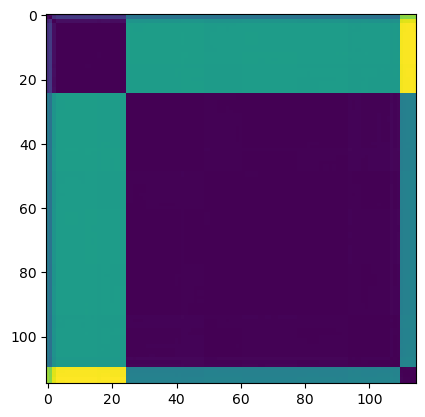

In [50]:
plt.imshow(dist_mat[order][:,order])

In [51]:
ag = AgglomerativeClustering(3, affinity="precomputed", linkage="average")
ag.fit(dist_mat)


C:\Users\patri\anaconda3\lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='precomputed', linkage='average', n_clusters=3)

  0%|                                    | 0/3 [00:00<?, ?it/s]

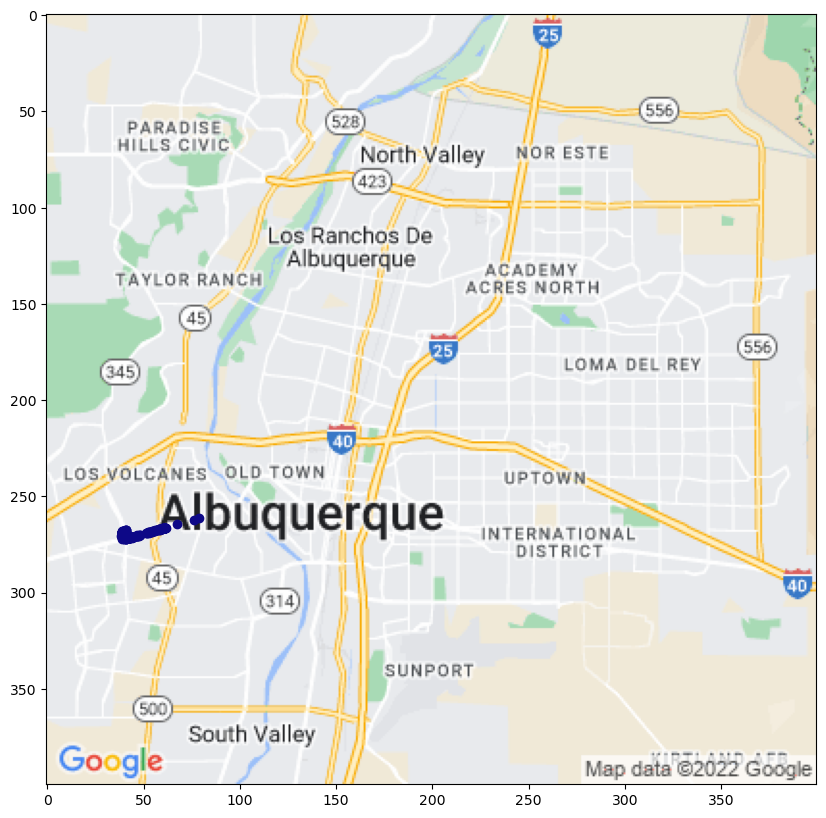

 33%|█████████▎                  | 1/3 [00:07<00:15,  7.78s/it]

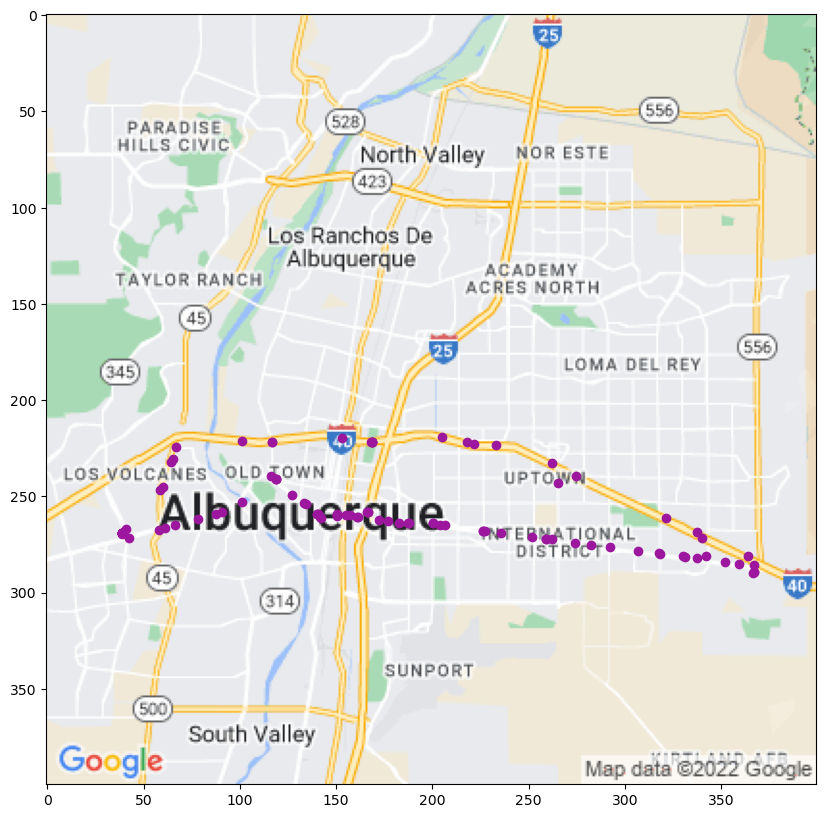

 67%|██████████████████▋         | 2/3 [00:09<00:04,  4.33s/it]

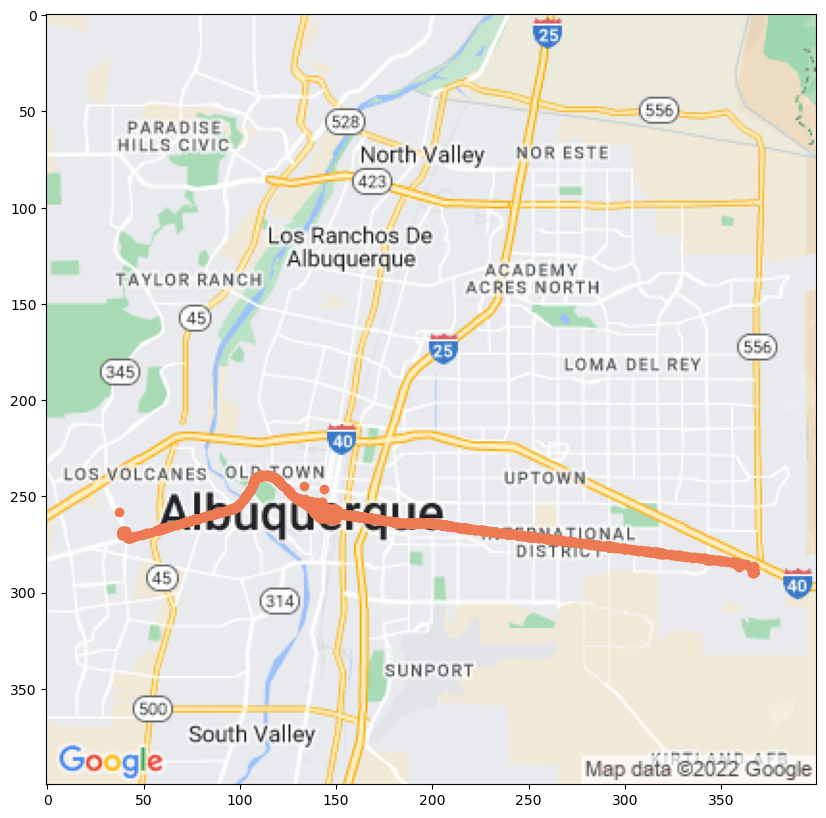

100%|████████████████████████████| 3/3 [00:37<00:00, 12.57s/it]


In [52]:
# img = Image.open('../abqtransit/abqmap2.png')
# plt.figure(figsize=(10,10))
# plt.imshow(img)
arts = np.array(list(arts))
for k in tqdm(range(ag.n_clusters)):
    img = Image.open('abqmap2.png')
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    for tid in arts[ag.labels_==k]:
        trip = route777_trips[route777_trips['trip_id']==tid].sort_values('msg_time', key=lambda x: [str2time(y) for y in x])
#         trip_arrays.append()
        for t in trip2array(trip,20):
            plot(t[0], t[1], cm.plasma(k/ag.n_clusters))
    plt.show()

In [53]:
correct_cluster = np.argmax([sum(ag.labels_==i) for i in range(ag.n_clusters)])
print("correct cluster is ", correct_cluster)
valid_arts = arts[ag.labels_==correct_cluster]
print(len(valid_arts))

correct cluster is  2
85


In [54]:
# img = Image.open('../abqtransit/abqmap2.png')
# plt.figure(figsize=(10,10))
# plt.imshow(img)

all_art_dicts = []
all_stops_dicts = []

for tid in tqdm(valid_arts):
    # get trip in time order
    trip = route777_trips[route777_trips['trip_id']==tid].sort_values('msg_time', key=lambda x: [str2time(y) for y in x])
    # remove time before the first stop
    first_stop = trip['next_stop_id'].iloc[0]
    trip_afterfirst = trip[trip['next_stop_id'] != first_stop]
    if len(trip_afterfirst) == 0:
        continue
    # What do I want to know for each trip?
    dists = []
    times = []
    speeds = []
    lastrow = trip[trip['next_stop_id']==first_stop].iloc[-1]
    for _,row in trip_afterfirst.iterrows():
#         plot(row['latitude'], row['longitude'], 'blue')
        
        if lastrow is None:
            lastrow = row
            continue
        dists.append(geopy.distance.geodesic([lastrow['latitude'], lastrow['longitude']], [row['latitude'],row['longitude']]).feet)
        times.append(str2time(row['msg_time']) - str2time(lastrow['msg_time']))
        speeds.append(row['speed_mph'])
        lastrow=row    
    
    adj_dists = np.array([d for t,d in zip(times, dists) if t > 0])
    adj_times = np.array([t for t,d in zip(times, dists) if t > 0])
    adj_speeds = np.array([s for t,s in zip(times, speeds) if t > 0])
    comp_speeds = (adj_dists / adj_times) * (3600 / 5280)
#     comp_speeds = [d*3600/(t*5280) for d,t in zip(adj_dists, adj_times)]
    # I want
    trip_info = {}
    trip_info['tid'] = tid
    # Total trip time
    trip_info['total_time'] = sum(adj_times)
    # Total trip distance
    trip_info['total_distance'] = sum(adj_dists)
    # First stop
    trip_info['first_stop'] = first_stop
    # Time below thresholds
    trip_info['time <2mph'] = adj_times[comp_speeds < 2].sum()
    trip_info['time <20mph'] = adj_times[comp_speeds < 20].sum()
    trip_info['time <40mph'] = adj_times[comp_speeds < 40].sum()
    trip_info['start'] = trip_afterfirst['msg_time'].iloc[0]
    trip_info['stop'] = trip_afterfirst['msg_time'].iloc[-1]
    
    # Accumulate stop info
    stopped_insts = []
    am_stopped = False
    last_row = None
    stop_ids = set(trip['next_stop_id'])
    stop_locations = np.array([[stoplocations[t]['lat'], stoplocations[t]['lng']] for t in stop_ids])
    for dt,(_,row) in zip(times,trip_afterfirst.iterrows()):
        if row['speed_mph'] <= 1:
            if not am_stopped:
                stopped_insts.append(0)
            am_stopped = True
            stopped_insts[-1] += dt
        else:
            if am_stopped:
                all_stops_dicts.append({'trip': tid, 'latitude': last_row['latitude'], 'longitude': last_row['longitude'], 'duration': stopped_insts[-1], 'first_stop': first_stop, 'distance_to_scheduled': min([ geopy.distance.geodesic([last_row['latitude'],last_row['longitude']], loc2).feet for loc2 in stop_locations])})
            am_stopped = False    
        last_row = row
    trip_info['number stops'] = len(stopped_insts)
    trip_info['time stopped'] = sum(stopped_insts)
    all_art_dicts.append(trip_info)


100%|██████████████████████████| 85/85 [00:39<00:00,  2.17it/s]


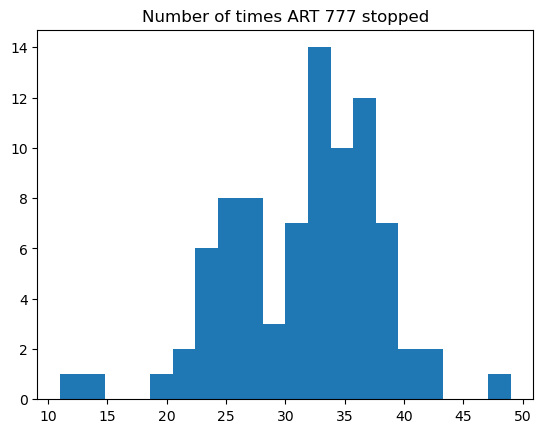

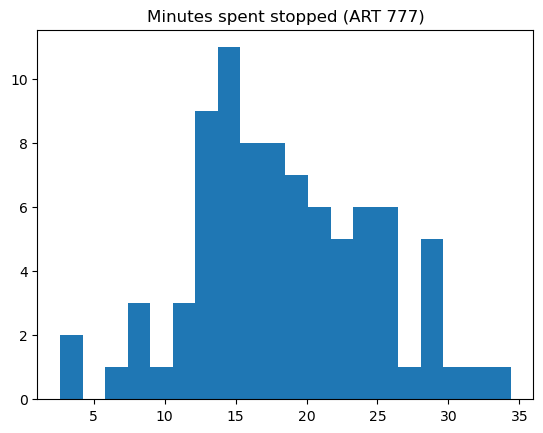

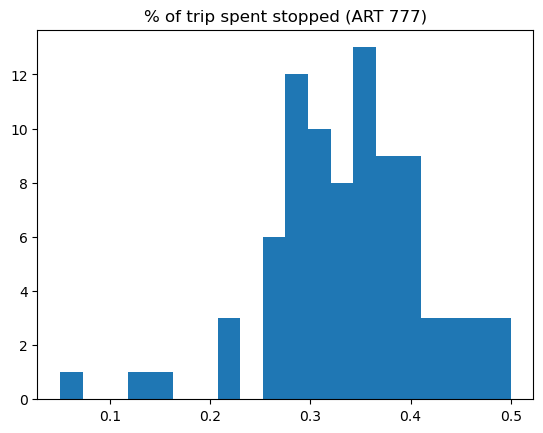

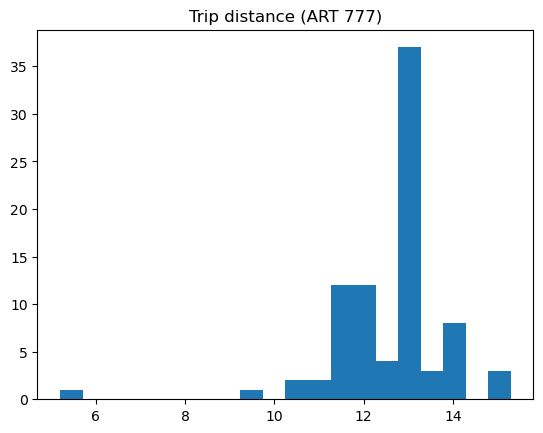

In [55]:
plt.hist([d['number stops'] for d in all_art_dicts], 20)
plt.title('Number of times ART 777 stopped')
plt.show()

plt.hist([d['time stopped']/60 for d in all_art_dicts], 20)
plt.title('Minutes spent stopped (ART 777)')
plt.show()
plt.hist([d['time stopped']/d['total_time'] for d in all_art_dicts], 20)
plt.title('% of trip spent stopped (ART 777)')
plt.show()

plt.hist([d['total_distance']/5280 for d in all_art_dicts], 20)
plt.title('Trip distance (ART 777)')
plt.show()

In [56]:
normal_arts = [d for d in all_art_dicts if 11 < d['total_distance']/5280 < 15]
print(len(normal_arts), len(all_art_dicts))
normal_tids = set([d['tid'] for d in normal_arts])
normal_stops = [d for d in all_stops_dicts if d['trip'] in normal_tids]
print(len(normal_stops), len(all_stops_dicts))
normal_arts_d = {d['tid']: d for d in normal_arts}

78 85
2464 2640


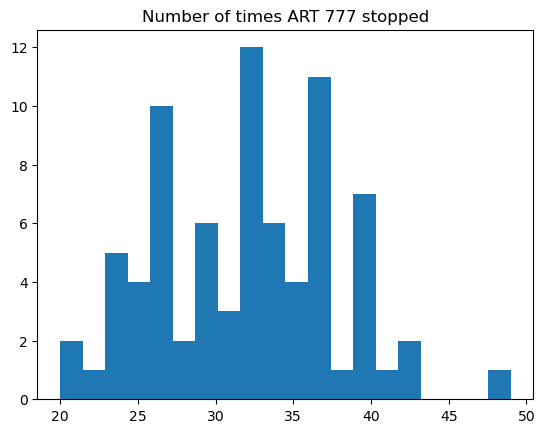

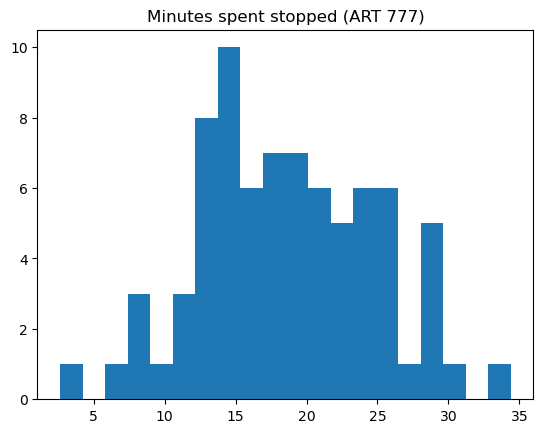

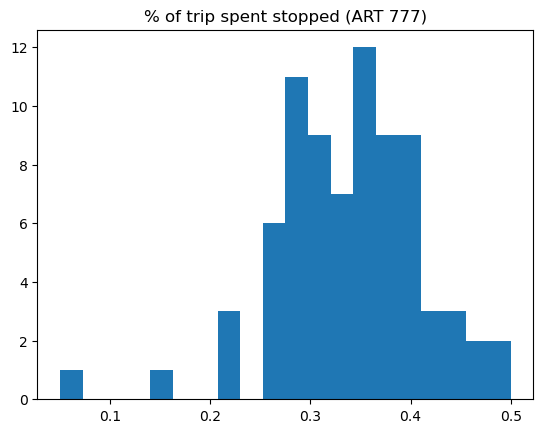

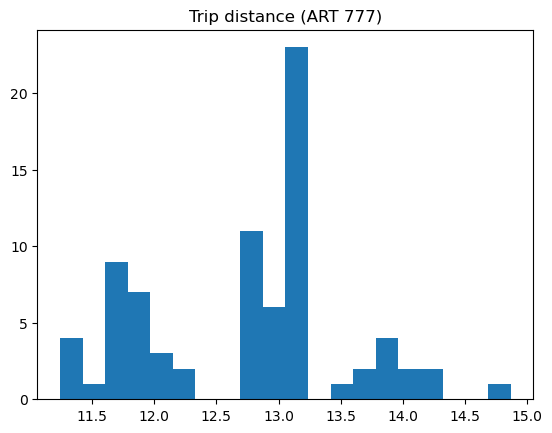

In [57]:
plt.hist([d['number stops'] for d in normal_arts], 20)
plt.title('Number of times ART 777 stopped')
plt.show()
plt.hist([d['time stopped']/60 for d in normal_arts], 20)
plt.title('Minutes spent stopped (ART 777)')
plt.show()
plt.hist([d['time stopped']/d['total_time'] for d in normal_arts], 20)
plt.title('% of trip spent stopped (ART 777)')
plt.show()

plt.hist([d['total_distance']/5280 for d in normal_arts], 20)
plt.title('Trip distance (ART 777)')
plt.show()

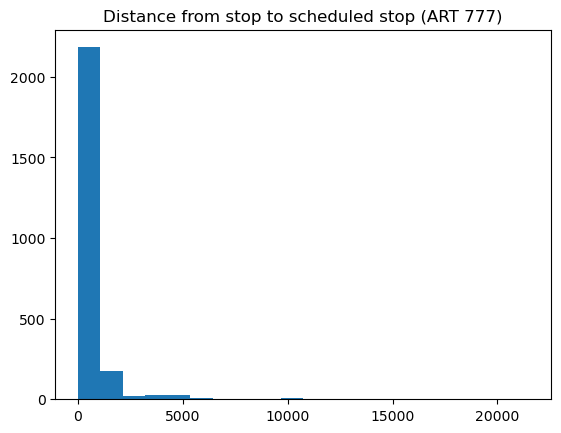

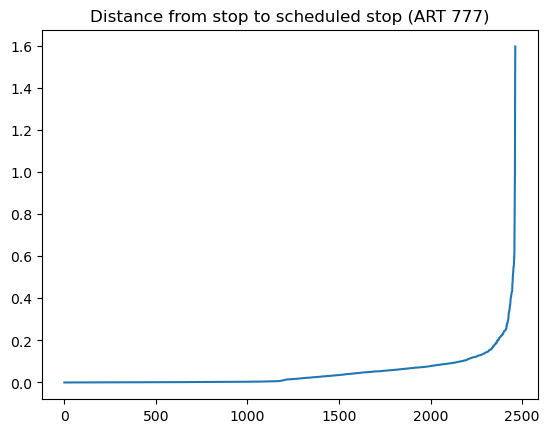

In [58]:
plt.hist([d['distance_to_scheduled'] for d in normal_stops], 20)
plt.title('Distance from stop to scheduled stop (ART 777)')
plt.show()

plt.plot(sorted([1/d['distance_to_scheduled'] for d in normal_stops]))
plt.title('Distance from stop to scheduled stop (ART 777)')
plt.show()

100%|█████████████████████| 2464/2464 [00:15<00:00, 160.40it/s]


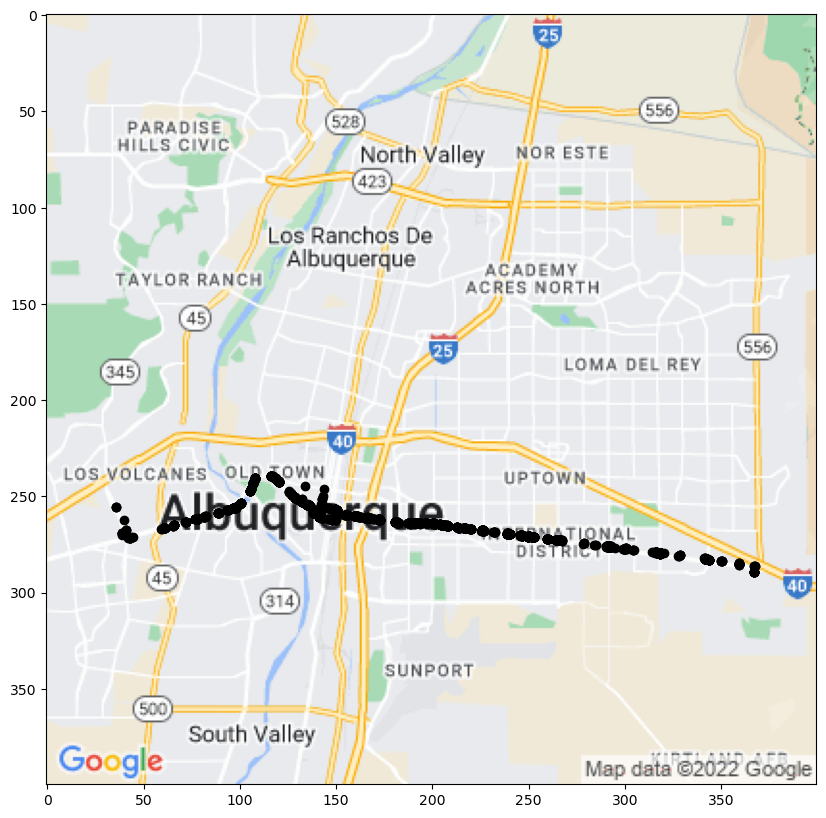

In [59]:
img = Image.open('abqmap2.png')
plt.figure(figsize=(10,10))
plt.imshow(img)
last_speed = -1
ctr = 0
for i,(row) in enumerate(tqdm(normal_stops)):
    plot(row['latitude'], row['longitude'], 'black')
    ctr += 1
plt.show()

In [60]:
stop_locations = np.array([ (row['latitude'], row['longitude']) for row in normal_stops])
stop_locations.shape

(2464, 2)

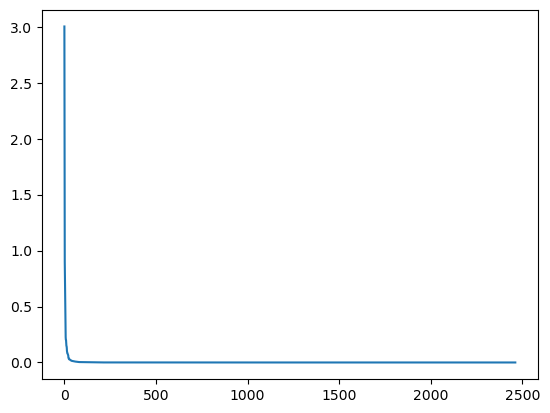

number of clusters:  26


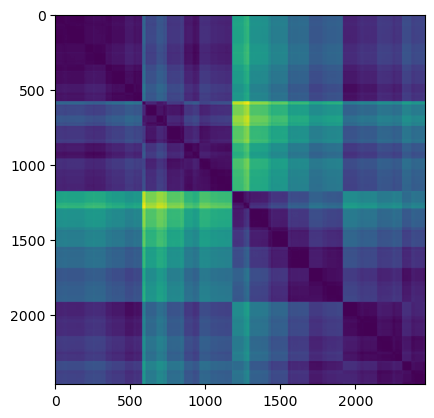

In [61]:
ag2, order = autocluster(stop_locations, True, plot=True)
plt.imshow(np.linalg.norm(stop_locations[None] - stop_locations[:,None], axis=-1)[order][:,order])
plt.show()

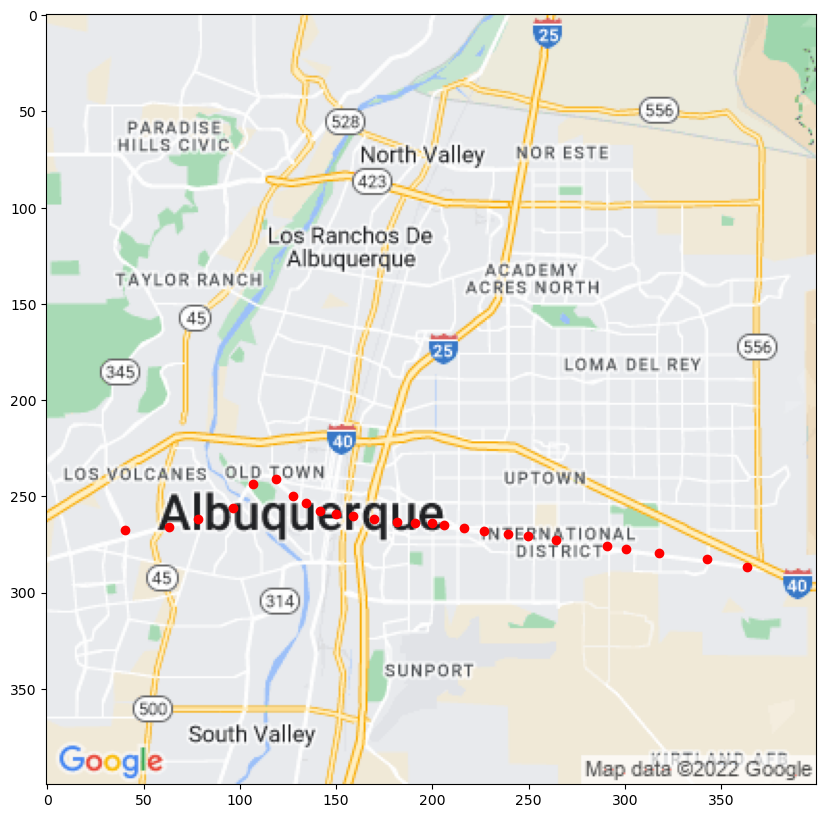

In [62]:
img = Image.open('abqmap2.png')
plt.figure(figsize=(10,10))
plt.imshow(img)
# last_speed = -1
# ctr = 0
for i in range(ag2.n_clusters):
    centroid = np.mean(stop_locations[ag2.labels_ == i],axis=0)
    plot(centroid[0], centroid[1], 'red')
#     ctr += 1
plt.show()

## Where are the stops?

In [63]:
stops_by_trip = pd.read_csv('stop_times.txt')
stops_by_trip

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,shape_dist_traveled
0,540757,6:19:00,6:19:00,704230369,1,NaN,NaN
1,540757,6:19:27,6:19:27,2013,2,NaN,0.3043
2,540757,6:19:57,6:19:57,2015,3,NaN,0.6456
3,540757,6:20:31,6:20:31,2017,4,NaN,1.0329
4,540757,6:21:08,6:21:08,2019,5,NaN,1.4522
...,...,...,...,...,...,...,...
183243,545918,6:47:02,6:47:02,3479,15,NaN,7.8711
183244,545918,6:48:08,6:48:08,3481,16,NaN,8.3112
183245,545918,6:49:22,6:49:22,3483,17,NaN,8.7999
183246,545918,6:50:51,6:50:51,704230977,18,NaN,9.3914


In [64]:
import json
with open('stoplocations.json') as file:
    stoplocations = json.load(file)

art777_stops = set(route777_trips['next_stop_id'])
art777_locations = np.array([[stoplocations[t]['lat'], stoplocations[t]['lng']] for t in art777_stops])

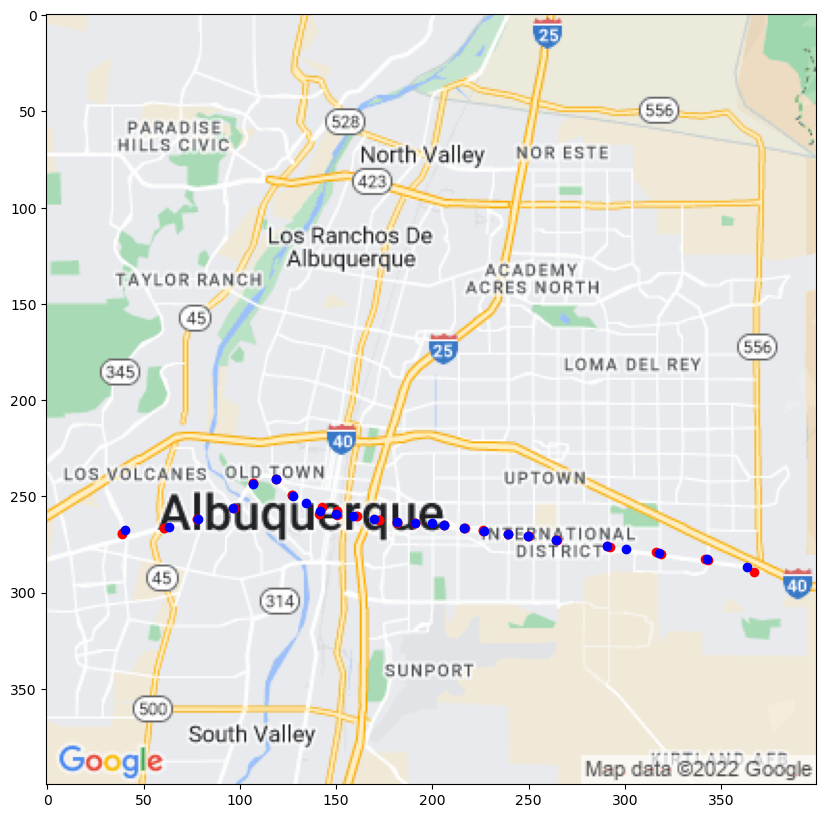

In [65]:
img = Image.open('abqmap2.png')
plt.figure(figsize=(10,10))
plt.imshow(img)
# last_speed = -1
# ctr = 0
for centroid in art777_locations:
    plot(centroid[0], centroid[1], 'red')
#     ctr += 1

for i in range(ag2.n_clusters):
    centroid = np.mean(stop_locations[ag2.labels_ == i],axis=0)
    plot(centroid[0], centroid[1], 'blue')

plt.show()

In [66]:
art777_locations.shape

(45, 2)

In [67]:
distance_to_stop = []
for loc in tqdm(stop_locations):
    distance_to_stop.append(min([ geopy.distance.geodesic(loc, loc2).feet for loc2 in art777_locations]))
distance_to_stop = np.array(distance_to_stop)

100%|██████████████████████| 2464/2464 [00:41<00:00, 58.92it/s]


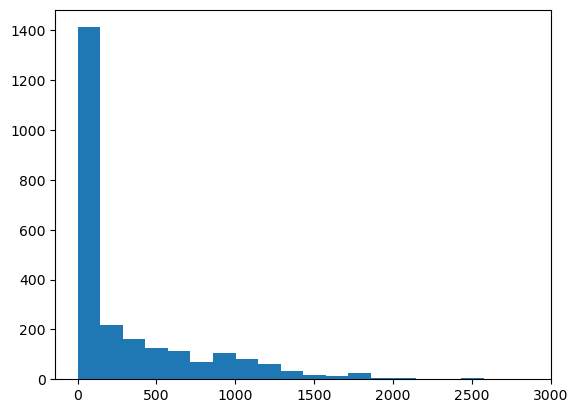

In [68]:
plt.hist(distance_to_stop, 20)
plt.show()

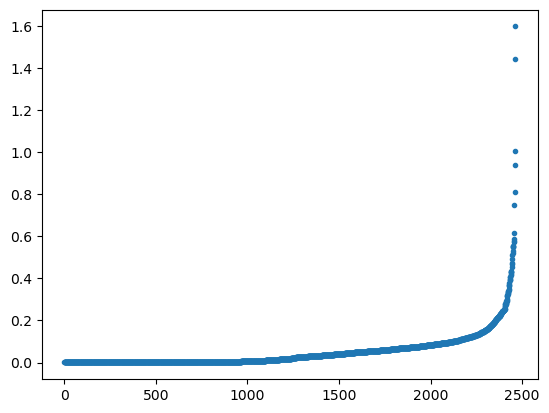

In [69]:
plt.plot(sorted(1/distance_to_stop),'.')
plt.show()

In [70]:
distance_to_stop.min()

0.6262698279035553

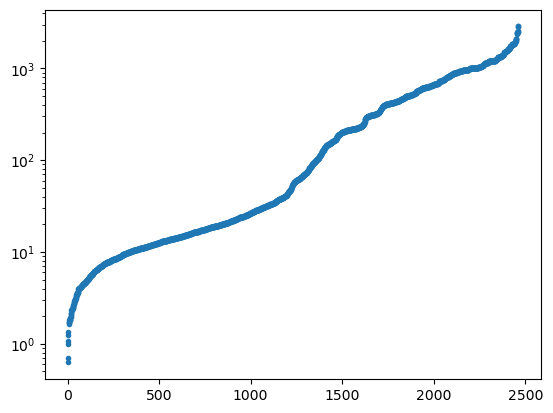

In [71]:
plt.plot(sorted(distance_to_stop),'.')
plt.yscale('log')
plt.show()

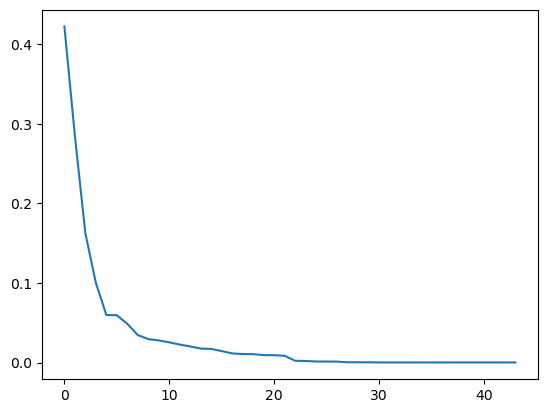

number of clusters:  5


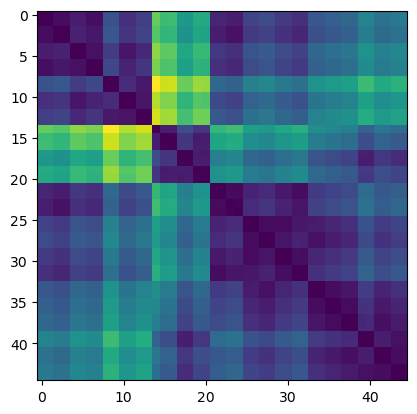

In [72]:
_, order = autocluster(art777_locations, True, plot=True)
plt.imshow(np.linalg.norm(art777_locations[None] - art777_locations[:,None], axis=-1)[order][:,order])
plt.show()

100%|██████████████████████████| 20/20 [03:36<00:00, 10.81s/it]


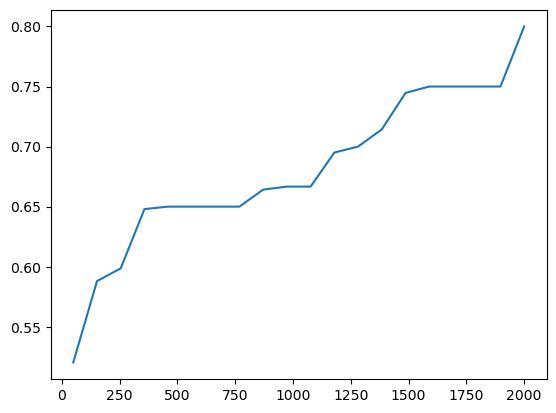

In [73]:
# I want to set a threshold such that I catch all of the actual stops
thresholds = np.linspace(50,2000,20)
fivepctile = np.zeros(len(thresholds))
n_stops = []
for i,threshold in enumerate(tqdm(thresholds)):
#     threshold = 100
    pct_caught = []
    tps = set([s['trip'] for s in normal_stops])
    for tid in tps:
        trip_stops = [s for s in normal_stops if s['trip'] == tid]
    #     sched_stops = np.array([[stoplocations[stopid['stop_id']]['lat'], stoplocations[stopid['stop_id']]['lng']] for _,stopid in stops_by_trip[stops_by_trip['trip_id']==int(tid)].iterrows()])
    #     sched_stops = art777_locations
        tmp = set(route777_trips[route777_trips['trip_id']==tid]['next_stop_id'])
        sched_stops = np.array([[stoplocations[t]['lat'], stoplocations[t]['lng']] for t in tmp])
        pct_caught.append(0)
        for s in sched_stops:
            for t in trip_stops:
                if geopy.distance.geodesic([t['latitude'],t['longitude']], s).feet < threshold:
                    pct_caught[-1] += 1
                    break
        pct_caught[-1] /= len(sched_stops)
        if i == 0:
            n_stops.append(len(sched_stops))
    fivepctile[i] = np.quantile(pct_caught, 0.05)
plt.plot(thresholds, fivepctile)
    
                
    

(array([ 1.,  0.,  0.,  3.,  0.,  2., 29.,  0., 32., 11.]),
 array([16. , 16.6, 17.2, 17.8, 18.4, 19. , 19.6, 20.2, 20.8, 21.4, 22. ]),
 <BarContainer object of 10 artists>)

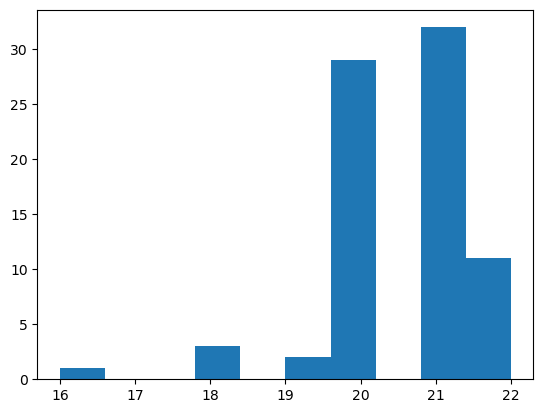

In [74]:
plt.hist(n_stops)

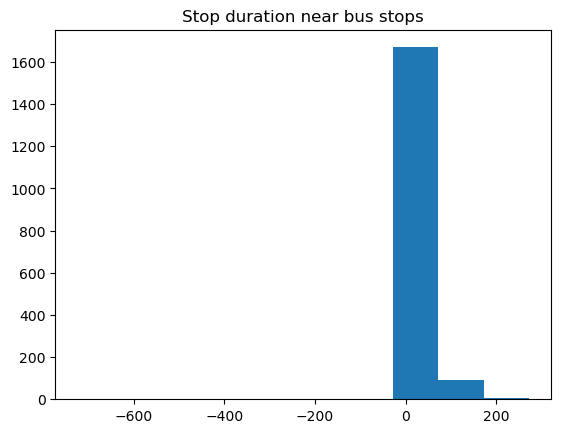

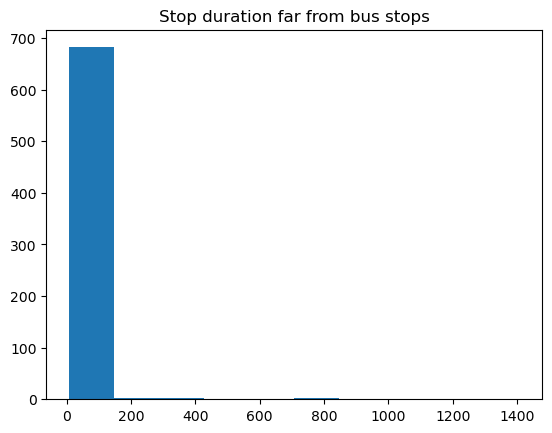

In [75]:
threshold=500
plt.title("Stop duration near bus stops")
plt.hist([d['duration'] for d in normal_stops if d['distance_to_scheduled'] < threshold])
plt.show()
plt.title("Stop duration far from bus stops")
plt.hist([d['duration'] for d in normal_stops if d['distance_to_scheduled'] > threshold])
plt.show()

In [76]:
len(arts)

115

# Route analysis

In [77]:
arts

array(['540222', '540202', '540258', '540259', '540226', '540247',
       '540201', '540262', '540228', '540215', '539899', '539872',
       '540263', '540217', '540251', '540286', '540277', '540216',
       '540264', '539903', '540207', '540214', '540246', '540254',
       '540238', '539911', '540285', '540267', '539891', '540288',
       '540255', '539873', '540234', '540283', '540224', '540240',
       '540279', '540236', '540280', '540227', '540221', '540218',
       '540235', '540223', '540270', '540275', '540256', '540284',
       '540233', '540212', '540210', '540253', '540245', '540252',
       '540271', '540225', '540203', '539895', '540239', '540272',
       '540248', '539874', '540211', '540205', '540199', '539907',
       '540249', '540266', '540200', '539886', '539902', '540274',
       '540243', '539894', '540278', '540250', '539885', '540257',
       '540276', '539888', '540220', '540231', '539904', '540237',
       '540208', '540229', '539884', '540204', '539901', '5402

Ok, so I want to extract a route from the latlon data, which really means a piecewise linear fit

In [78]:
def k_subspaces(data, k, d=1, max_iters=100, reps=10):
    best_loss = np.inf
    for _ in range(reps):
        assignments = np.zeros(len(data), dtype=int)
        pivots = np.sort(np.random.random(k+1))
        
        pivots -= pivots[0]
        pivots /= pivots[-1]
        pivots = (pivots*len(data)).astype(int)
        for i,p in enumerate(pivots[:-1]):
            assignments[p:pivots[i+1]]=i
#         return assignments, pivots
        
#         (np.arange(len(data))*k/len(data)).astype(int) #np.random.randint(k, shape=len(data))
        changed = 1
        iters = max_iters
        while changed > 0 and iters > 0:
            means = np.array([ np.mean(data[assignments==i], axis=0) for i in range(k)]) # k x D
            bases = np.array([ np.linalg.svd(data[assignments==i] - mean)[2][d:].T for i,mean in enumerate(means)])
            # k x D x d
            changed = 0
            for i in range(1,k):
                start = np.argmax(assignments==i)
                if assignments[start] != i:
                    continue
                # start is the first index of block i
                checking=True
                while start < len(assignments):
                    # see if start needs to decrement
                    if np.linalg.norm((data[start] - means[i]) @ bases[i]) > np.linalg.norm((data[start] - means[i-1]) @ bases[i-1]):
                        assignments[start] = i-1
                        start += 1
                        changed += 1
                    # see if previous needs to increment
                    elif  start > 0 and np.linalg.norm((data[start-1] - means[i]) @ bases[i]) < np.linalg.norm((data[start-1] - means[i-1]) @ bases[i-1]):# 
                        assignments[start] = i
                        start -= 1
                        changed += 1
                    else:
                        break
            iters -= 1
            loss = sum([np.linalg.norm((data[i] - means[j]) @ bases[j]) for i,j in enumerate(assignments)])
            print(changed, iters, loss, end='\r')
        if loss < best_loss:
            best_loss = loss
            best_assignments = assignments
        print()
    return best_assignments
        

In [79]:
msg_times = [str2time(t) for t in onetrip.msg_time]
bus_location = np.array([ onetrip.latitude, onetrip.longitude]).T
bus_location = bus_location[np.argsort(msg_times)]
bus_location.shape

(448, 2)

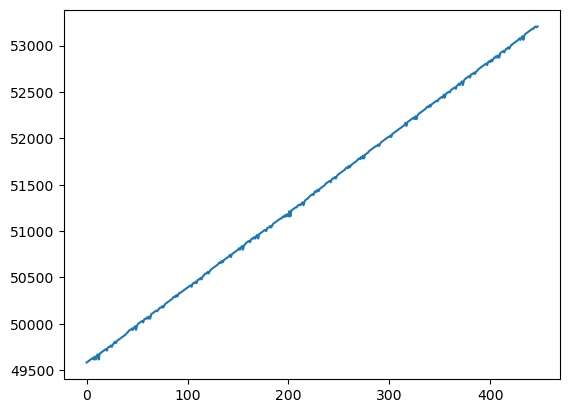

In [80]:
plt.plot([str2time(t) for t in onetrip.msg_time])

In [81]:
assignments = k_subspaces(bus_location, 20, 1)

3 0 0.01877077229882215567
8 0 0.02073963137634903336
8 0 0.02215340794732488834
4 0 0.04877456114565842254


C:\Users\patri\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\patri\anaconda3\lib\site-packages\numpy\core\_methods.py:182: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


5 0 0.0450144943846682855
10 0 0.0180647228391691667
6 0 0.01327603251605243774
7 0 0.01707354460660822556
6 0 0.02309762109457281773
6 0 0.01092865474046477669


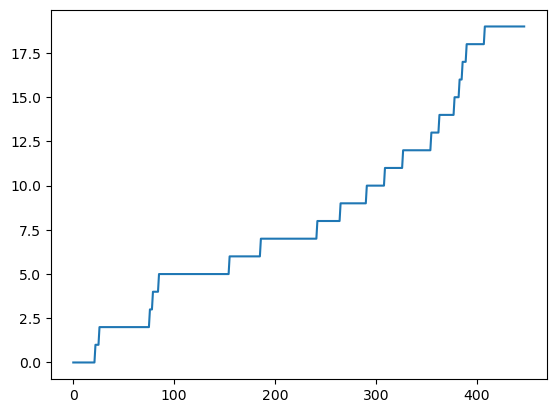

In [82]:
plt.plot(assignments)
plt.show()

In [83]:
p

3

In [84]:
# np.sort(pivots)

loading image


C:\Users\patri\AppData\Local\Temp\ipykernel_25704\304786553.py:8: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'latitude' in row:


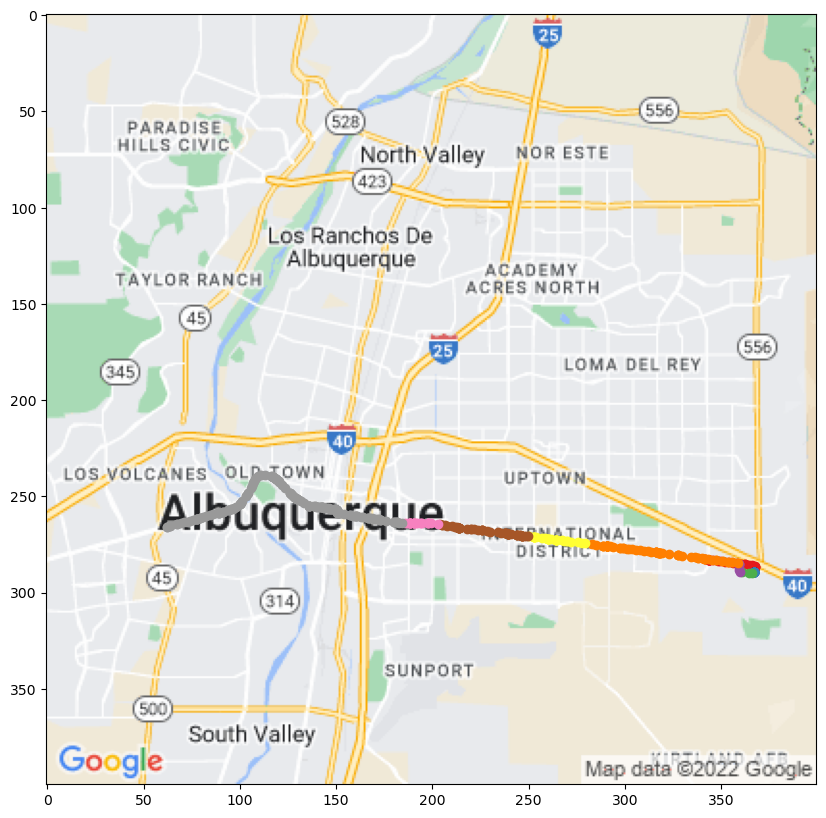

In [85]:
for i in range(assignments.max()+1):
    plot_abq(bus_location[assignments==i], first=(i==0), c=cm.Set1(i/10))
plt.show()

loading image


C:\Users\patri\AppData\Local\Temp\ipykernel_25704\304786553.py:8: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'latitude' in row:


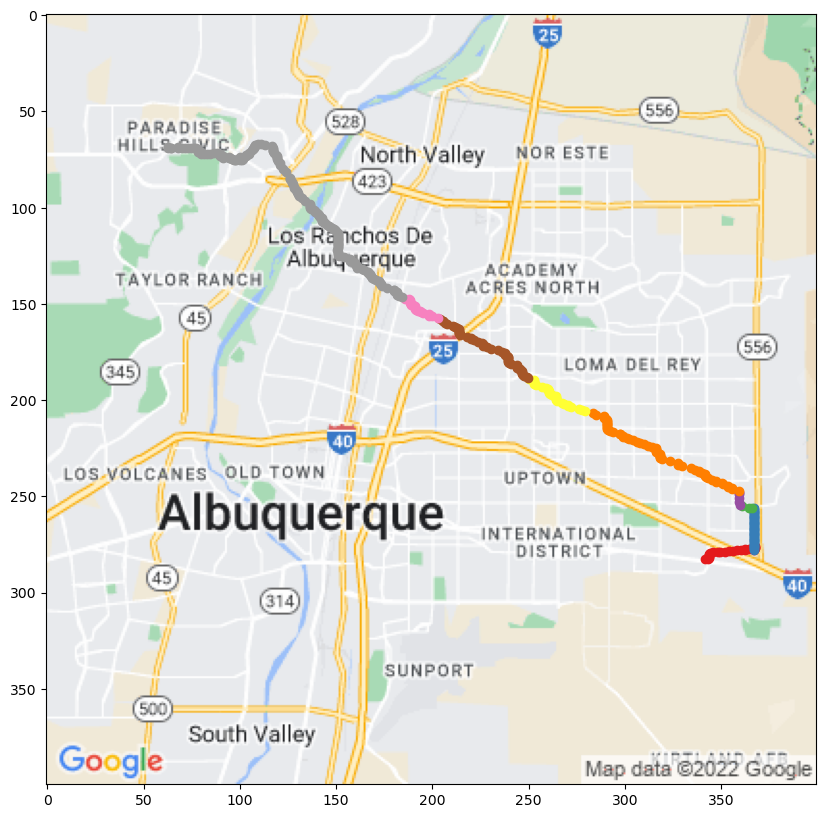

In [86]:
for i in range(assignments.max()+1):
    plot_abq((bus_location + np.vstack([np.arange(len(bus_location)), np.zeros(len(bus_location))]).T/4000)[assignments==i], first=(i==0), c=cm.Set1(i/10))
plt.show()

In [87]:
# means[i].shape

In [88]:
# bases.shape

In [89]:
assignments.dtype

dtype('int32')

# Maybe it'd just be better to do this nonparametrically

So really, I want to be able to have some marker of "how far into the trip am I right now", since doing cumulative miles is going to be noisy

In [90]:
valid_arts

array(['540222', '540258', '540259', '540226', '540247', '540262',
       '540228', '540215', '540263', '540217', '540251', '540286',
       '540277', '540216', '540264', '540207', '540214', '540246',
       '540254', '540238', '540285', '540267', '540288', '540255',
       '540234', '540283', '540224', '540240', '540279', '540236',
       '540280', '540227', '540221', '540218', '540235', '540223',
       '540270', '540275', '540256', '540284', '540212', '540210',
       '540253', '540245', '540252', '540271', '540225', '540203',
       '540239', '540272', '540248', '540211', '540205', '540199',
       '540249', '540266', '540274', '540243', '540278', '540250',
       '540257', '540276', '540231', '540237', '540208', '540229',
       '540204', '540230', '540287', '540265', '540269', '540206',
       '540273', '540268', '540209', '540219', '540282', '540242',
       '540261', '540260', '540232', '540241', '540281', '540213',
       '540244'], dtype='<U6')

In [91]:
valid_trips = [df[df['trip_id']==id] for id in valid_arts]
len(valid_trips)

85

In [92]:
# are all of these trips going the same way?
valid_trip_locations = []
for trip in valid_trips:
    msg_times = [str2time(t) for t in trip.msg_time]
    location = np.array([ trip.latitude, trip.longitude]).T
    location = location[np.argsort(msg_times)]
    valid_trip_locations.append(location)

In [93]:
[t[0][0] < t[-1][0] for t in valid_trip_locations]

[False,
 True,
 True,
 False,
 True,
 True,
 False,
 False,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 False,
 False,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 True,
 False,
 False,
 True,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 True,
 True,
 False,
 False,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 True,
 True,
 False,
 False,
 False,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 False,
 True,
 True,
 False,
 False,
 True,
 False,
 True,
 True,
 False,
 False,
 True,
 False,
 True]

In [94]:
valid_eb_locations = [t for t in valid_trip_locations if t[0][0] < t[-1][0]]
valid_wb_locations = [t for t in valid_trip_locations if t[0][0] > t[-1][0]]
valid_eb_arts = [valid_arts[i] for i,t in enumerate(valid_trip_locations) if t[0][0] < t[-1][0]]
valid_wb_arts = [valid_arts[i] for i,t in enumerate(valid_trip_locations) if t[0][0] > t[-1][0]]
print( len(valid_eb_locations), len(valid_wb_locations), len(valid_trip_locations))
print( len(valid_eb_arts), len(valid_wb_arts), len(valid_arts))


44 41 85
44 41 85


In [95]:
# ok, so now I have a bunch of WB buses (resp. EB)
# how much does the distance traveled vary among them?
wb_dists = []
for locs in tqdm(valid_wb_locations):
    dist = 0
    for i,(lat2,lon2) in enumerate(locs[1:]):
        lat1,lon1 = locs[i]
        dist += geopy.distance.geodesic([lat1,lon1], [lat2,lon2]).feet
    wb_dists.append(dist)
wb_dists = np.array(wb_dists)

100%|██████████████████████████| 41/41 [00:05<00:00,  7.04it/s]


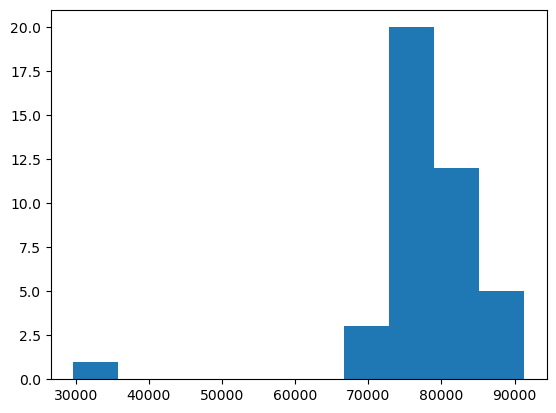

In [96]:
plt.hist(wb_dists)
plt.show()

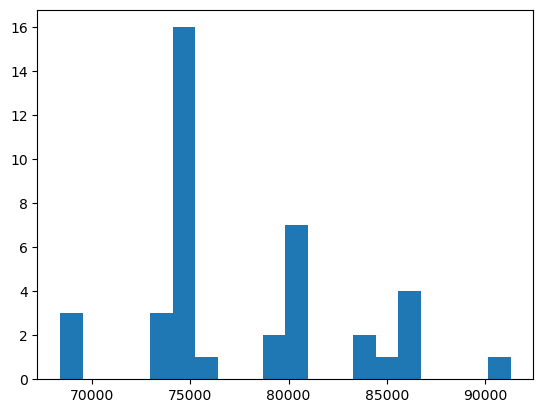

In [97]:
plt.hist(wb_dists[wb_dists > 40000], bins=20)
plt.show()

  0%|                                   | 0/41 [00:00<?, ?it/s]C:\Users\patri\AppData\Local\Temp\ipykernel_25704\304786553.py:8: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'latitude' in row:
100%|██████████████████████████| 41/41 [00:00<00:00, 54.85it/s]


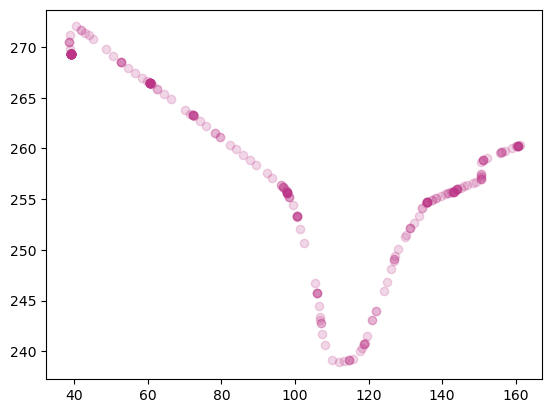

In [98]:
for i,locs in enumerate(tqdm(valid_wb_locations)):
    if wb_dists[i] > 50000:
        continue
    plot_abq(locs, alpha=0.2, c=cm.plasma(i/len(valid_wb_locations)), first=(i==0))

In [99]:
plt.show()

In [100]:
# The ART takes so many different routes
# well, there are several that take a certain route
main_wb_arts = [valid_wb_arts[i] for i,d in enumerate(wb_dists) if 74000 < d < 76000]
main_wb_dists = [wb_dists[i] for i,d in enumerate(wb_dists) if 74000 < d < 76000]
main_wb_locations = [valid_wb_locations[i] for i,d in enumerate(wb_dists) if 74000 < d < 76000]

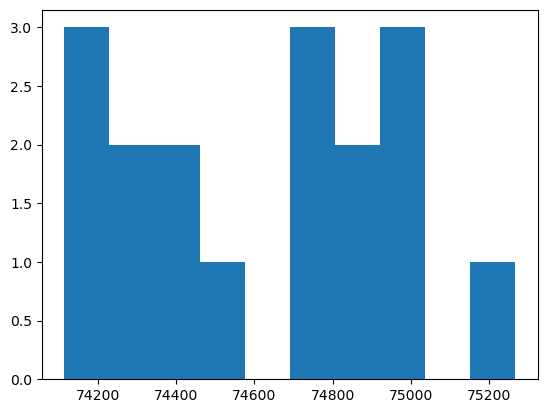

In [101]:
plt.hist(main_wb_dists)
plt.show()

In [102]:
# Can I turn a trip into a function of cumulative distance?
from scipy.interpolate import interp1d

def trip2function(trip):
    # first, make sure the trip info is in order
    lats = trip.latitude.to_numpy()
    lons = trip.longitude.to_numpy()
    times = [ str2time(t) for t in trip.msg_time]
    msg_order = np.argsort(times)
    lats = lats[msg_order]
    lons = lons[msg_order]
    cumdist = [0]
    for i,(lat2,lon2) in enumerate(zip(lats, lons)):
        if i > 0:
            cumdist.append( cumdist[-1] + geopy.distance.geodesic([lat1,lon1], [lat2,lon2]).feet)
        lat1,lon1 = lat2,lon2
    cumdist = np.array(cumdist) / cumdist[-1]
    lat_interp = interp1d(cumdist, lats)
    lon_interp = interp1d(cumdist, lons)
    return lambda t: np.array([lat_interp(t), lon_interp(t)])

def measure_length(trip):
    lats = trip.latitude.to_numpy()
    lons = trip.longitude.to_numpy()
    times = [ str2time(t) for t in trip.msg_time]
    msg_order = np.argsort(times)
    lats = lats[msg_order]
    lons = lons[msg_order]
    dist = 0
    for i,(lat2,lon2) in enumerate(zip(lats, lons)):
        if i > 0:
            dist += geopy.distance.geodesic([lat1,lon1], [lat2,lon2]).feet
        lat1,lon1 = lat2,lon2
    return dist

# tf = trip2function(onetrip)
    

In [103]:
# plt.plot([tf(i)[0] for i in np.linspace(0,1,100)])
# plt.show()

In [104]:
art_trips = [ df[df['trip_id']==id] for id in tqdm(arts)]
trip_functions = [ trip2function(t) for t in tqdm(art_trips)]

100%|████████████████████████| 115/115 [00:16<00:00,  7.09it/s]


In [105]:
def matnorm(mat, p):
    return (abs(mat)**p).sum()**(1/p)

num_points = 1000
dmat = np.zeros((len(trip_functions), len(trip_functions)))
for i in tqdm(range(len(trip_functions))):
    for j in range(i+1, len(trip_functions)):
        dmat[i,j] = matnorm(np.array([(trip_functions[i](t) - trip_functions[j](t)) for t in np.linspace(0,1,num_points)]), p=0.5)/num_points
        dmat[j,i] = dmat[i,j]

  5%|█▎                        | 6/115 [01:29<27:02, 14.89s/it]


KeyboardInterrupt: 

In [ ]:
plt.imshow(dmat)
plt.show()

In [ ]:
ag, lmat = autocluster(dmat, affinity="precomputed", linkage='average', return_order=True, plot=True)
order = lmat#['leaves']
plt.imshow(dmat[order][:,order])
plt.show()

In [ ]:
# ok, now sanity check
for i in range(ag.n_clusters):
    plt.title(f'{i}')
    plt.hist([measure_length(at) for j,at in zip(ag.labels_, art_trips) if j == i])
    plt.show()

In [ ]:
for i in tqdm(range(ag.n_clusters)):
    first=True
    for j, at in zip(ag.labels_, trip_functions):
        if j != i:
            continue
        plot_abq(np.array([at(t) for t in np.linspace(0,1,50)]), alpha=0.2, c=cm.plasma(i/len(valid_wb_locations)), first=first)
        first=False
    plt.show()

In [ ]:
for i in tqdm(range(ag.n_clusters)):
    first=True
    for idx,(j, at) in enumerate(zip(ag.labels_, trip_functions)):
        if j != i:
            continue
        plot_abq(np.array([at(t) for t in np.linspace(0,1,50)]), alpha=0.2, c=cm.plasma(i/len(valid_wb_locations)), first=first)
#         first=False
        plt.title(idx)
        plt.show()
    break

In [ ]:
# 53, 46, 112
for i in [46, 53, 112]:
    for j in [46, 53, 112]:
        if j <= i:
            continue
        plt.scatter( [trip_functions[i](t)[0] for t in np.linspace(0,1,100)], [trip_functions[j](t)[0] for t in np.linspace(0,1,100)])
        plt.title(f'{i} vs {j} latitude')
        plt.show()
        plt.scatter( [trip_functions[i](t)[1] for t in np.linspace(0,1,100)], [trip_functions[j](t)[1] for t in np.linspace(0,1,100)])
        plt.title(f'{i} vs {j} longitude')
        plt.show()

In [ ]:
# 53, 46, 112
for i in [46, 53, 112]:
    for j in [46, 53, 112]:
        if j <= i:
            continue
        plt.plot( [trip_functions[i](t)[0] for t in np.linspace(0,1,100)], '.')
        plt.plot([trip_functions[j](t)[0] for t in np.linspace(0,1,100)], '.')
        plt.title(f'{i} vs {j} latitude')
        plt.show()
        plt.plot( [trip_functions[i](t)[1] for t in np.linspace(0,1,100)], '.')
        plt.plot([trip_functions[j](t)[1] for t in np.linspace(0,1,100)], '.')
        plt.title(f'{i} vs {j} longitude')
        plt.show()

In [ ]:
# 53, 46, 112
for i in [46, 53, 112]:
        plt.plot( [trip_functions[i](t)[0] for t in np.linspace(0,1,100)], '.')
        plt.title(f'{i} latitude')
        plt.show()
        plt.plot( [trip_functions[i](t)[1] for t in np.linspace(0,1,100)], '.')
        plt.title(f'{i} longitude')
        plt.show()

# Ok, maybe all I can hope for is decomposing into legs

In [ ]:
# can I split into stops?

In [113]:
with open('stopnames.json') as file:
    stopnames = json.load(file)

  0%|                                   | 0/22 [00:00<?, ?it/s]C:\Users\patri\AppData\Local\Temp\ipykernel_25704\304786553.py:8: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'latitude' in row:
  9%|██▍                        | 2/22 [00:00<00:01, 10.06it/s]

ART - West Central Station
loading image
ART - International District Station
loading image


 18%|████▉                      | 4/22 [00:00<00:01, 11.97it/s]

ART - Downtown Station
loading image
ART - Nob Hill East Station
loading image
ART - West Downtown Station
loading image


 27%|███████▎                   | 6/22 [00:00<00:01, 11.00it/s]

ART - Presbyterian Station
loading image
Central @ Eubank  (ART)
loading image
ART - BioPark Station
loading image


 45%|███████████▊              | 10/22 [00:00<00:01, 11.65it/s]

ART - EDo Station
loading image
ART - San Pedro Station
loading image
ART - Nob Hill Station
loading image


 55%|██████████████▏           | 12/22 [00:01<00:00, 12.42it/s]

ART - UNM Popejoy Station
loading image
Tramway @ Wenonah (ART)
loading image


 64%|████████████████▌         | 14/22 [00:01<00:00,  8.85it/s]

ART - Highland Station
loading image
Central @ Juan Tabo  (ART)
loading image
ART - The Bluffs Station
loading image


 82%|█████████████████████▎    | 18/22 [00:01<00:00, 10.14it/s]

ART - Old Town Station
loading image
ART - San Mateo Station
loading image
Central @ Wyoming (ART)
loading image


 91%|███████████████████████▋  | 20/22 [00:01<00:00, 10.10it/s]

ART - Town of Atrisco Station
loading image
ART - UNM / CNM Station
loading image
ART - Main Library Station
loading image


C:\Users\patri\AppData\Local\Temp\ipykernel_25704\304786553.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,10))
100%|██████████████████████████| 22/22 [00:02<00:00, 10.45it/s]


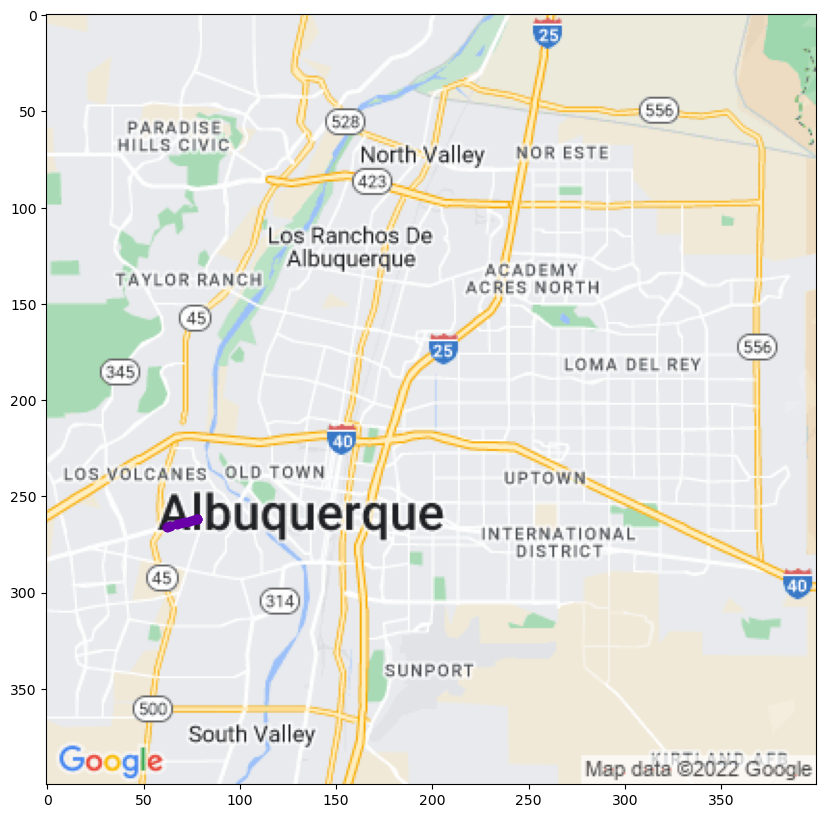

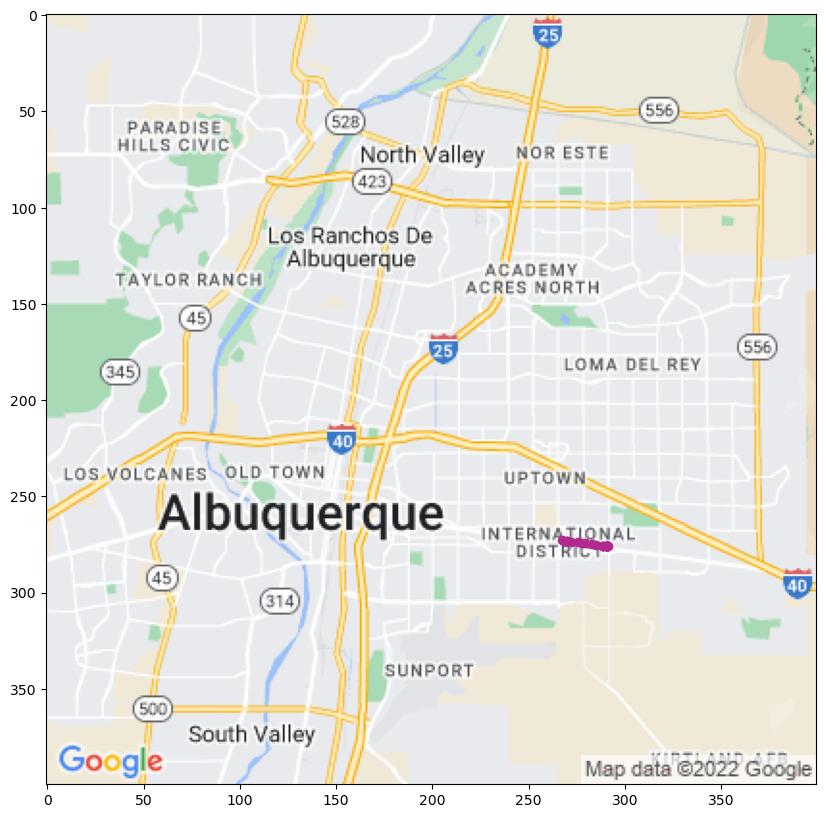

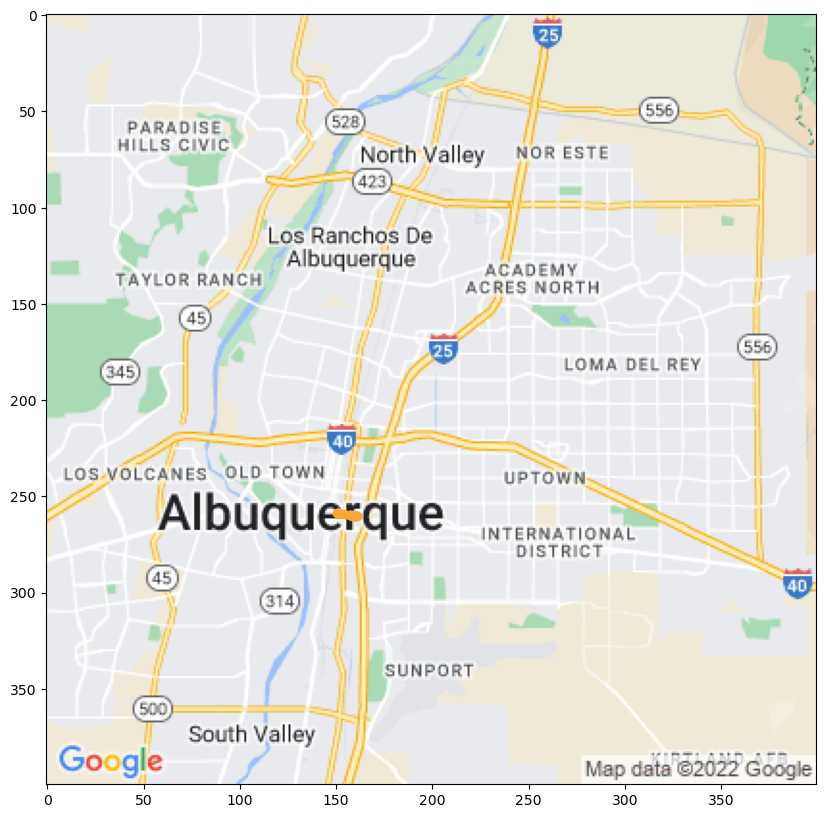

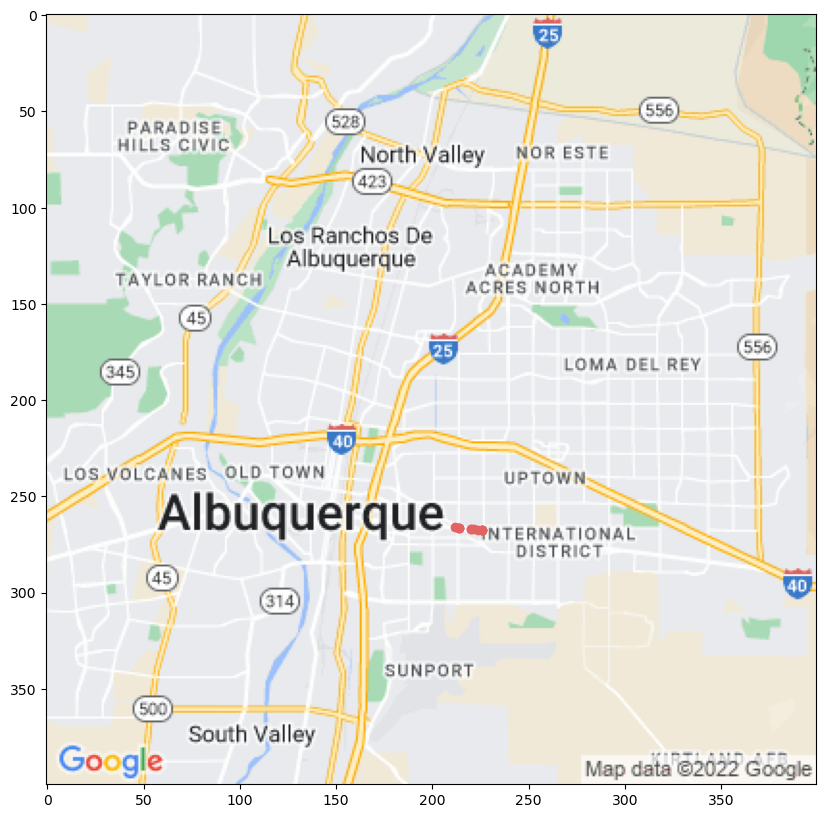

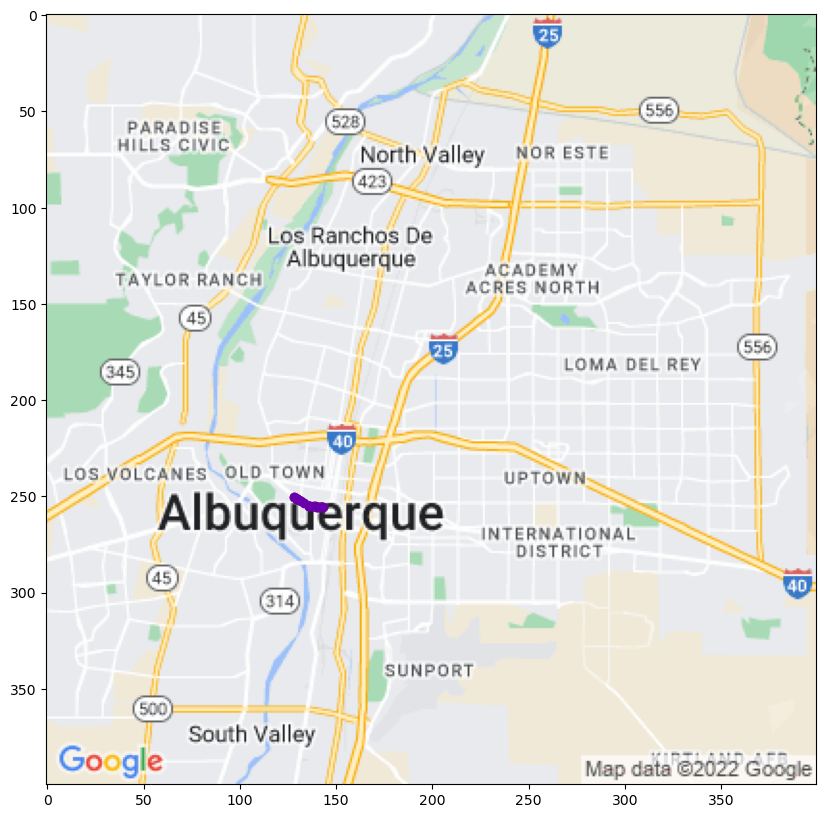

...

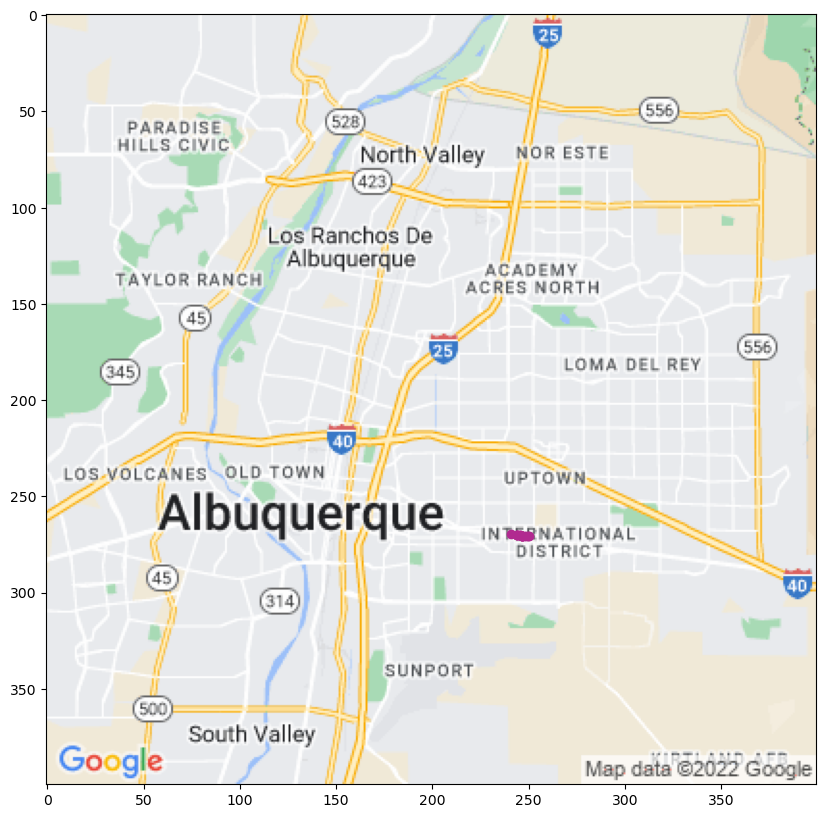

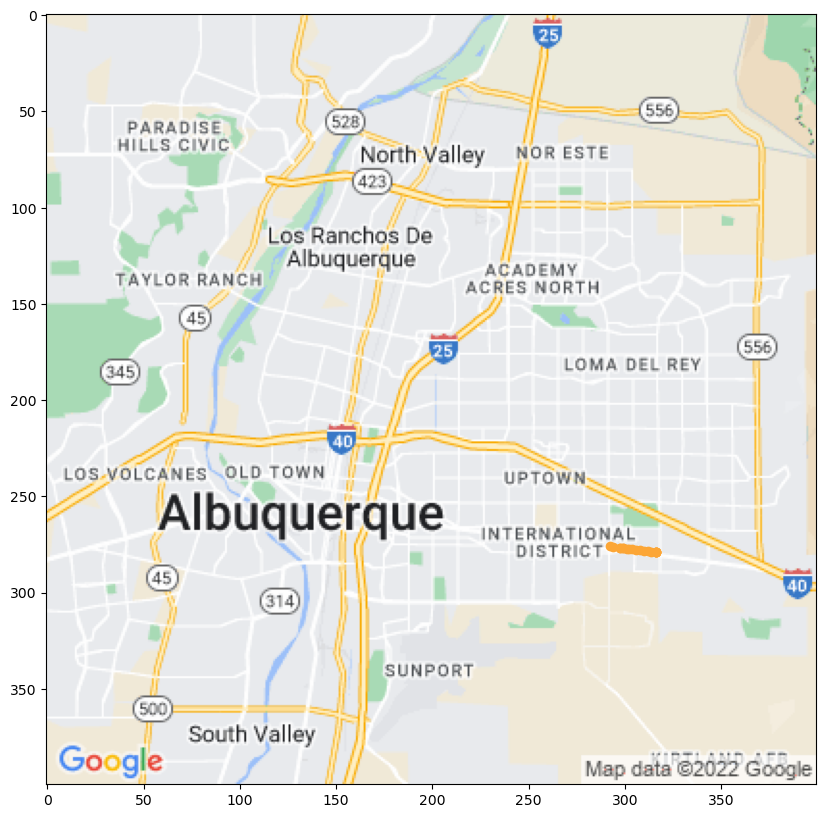

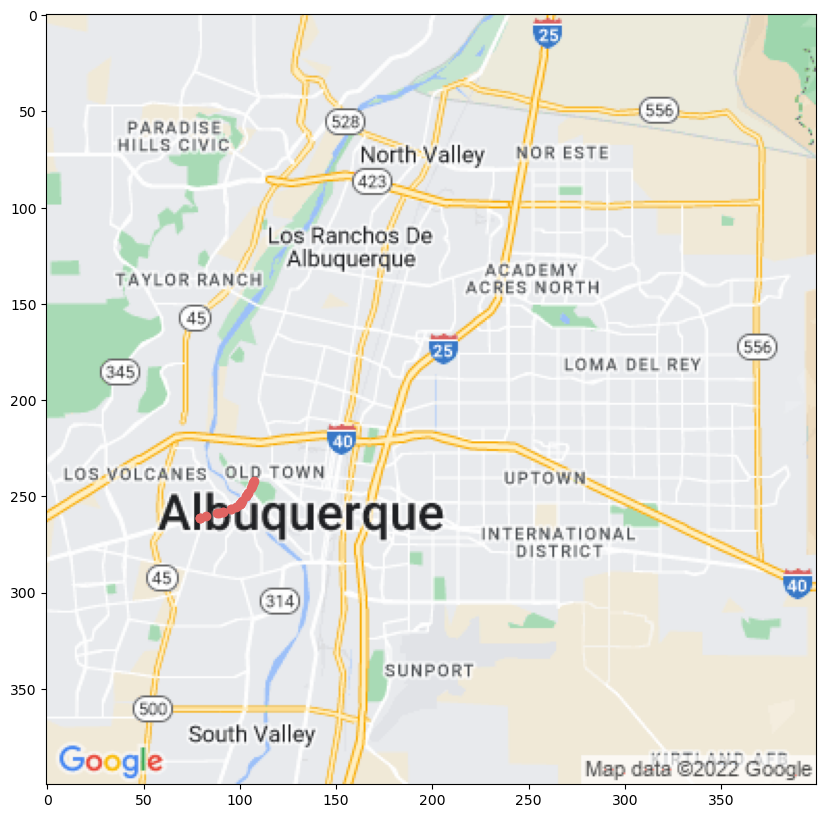

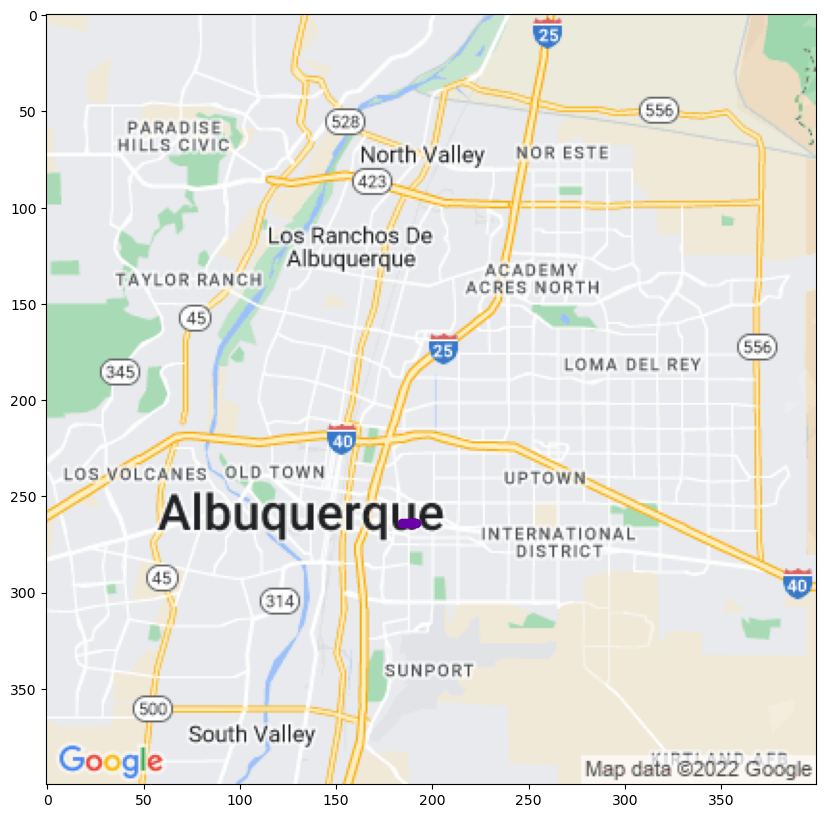

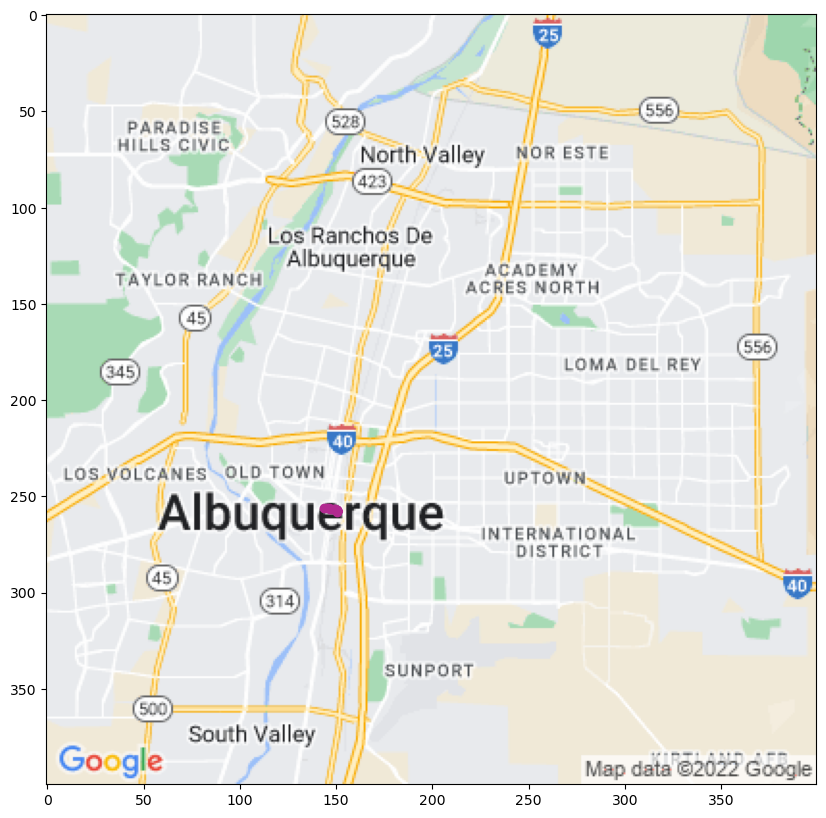

In [114]:
onetrip_order = np.argsort(onetrip.msg_time).to_numpy()
onetrip_latitude = onetrip.latitude.iloc[onetrip_order]
first = True
onetrip_sorted = onetrip.iloc[onetrip_order]
for i,nstop in enumerate(tqdm(set(onetrip.next_stop_id))):
    print(stopnames[nstop])
    plot_abq(np.vstack([onetrip_sorted[onetrip_sorted.next_stop_id == nstop].latitude, onetrip_sorted[onetrip_sorted.next_stop_id == nstop].longitude]).T, first,c=cm.plasma((7**i) % 5 / 5))
#     first = False

In [ ]:
autocluster

In [111]:
129.07+97.02+409.41+131.8

767.3

In [175]:
# Which traffic light do I think is the most problematic?
# Probably Girard
# I really want to look at having to stop at farside intersections, which should probably have a distinctive double-dip
# Which Louisiana, San Mateo, maybe San Pedro, maybe Washington should demonstrate
# San Pedro is nice because the stop is so far away from San Pedro
# Ok, so let's look at what ARTs look like between San Pedro and Louisiana

def art_between(art, start, stop):
    # sort the dataset
    art = art.iloc[np.argsort(art.msg_time)]
    # get the last message corresponding to the first stop
    distances_start = [geopy.distance.geodesic((row['latitude'], row['longitude']), (stoplocations[start]['lat'], stoplocations[start]['lng'])).feet for _,row in art.iterrows()]
    start_idx = np.argmin(distances_start)
    distances_stop = [geopy.distance.geodesic((row['latitude'], row['longitude']), (stoplocations[stop]['lat'], stoplocations[stop]['lng'])).feet for _,row in art.iterrows()]
    stop_idx = np.argmin(distances_stop)
    
    assert stop_idx > start_idx
    start_idx -= 5
    stop_idx += 5
    return art.iloc[start_idx:stop_idx]

def stop_lookup(art, stop):
    stops = art[art.next_stop_name == stop]
    return list(stops.next_stop_id)[0]

In [166]:
print(stop_lookup(onetrip, 'ART - International District Station'))
print(stop_lookup(onetrip, 'ART - San Pedro Station'))

704230858
704230974


In [176]:
sp_lou = art_between(onetrip, '704230858', '704230974')

In [128]:
stopids['ART - International District Station']

'704230879'

In [123]:
[s for s in stopids if 'ART' in s]

['Central @ Juan Tabo  (ART)',
 'Central @ Eubank  (ART)',
 'Central @ Wyoming (ART)',
 'Tramway @ Wenonah (ART)',
 'Central @ Eubank (ART)',
 'Central @ Juan Tabo (ART)',
 'ART - West Central Station',
 'ART - The Bluffs Station',
 'ART - Town of Atrisco Station',
 'ART - Old Town Station',
 'ART - West Downtown Station',
 'ART - EDo Station',
 'ART - Presbyterian Station',
 'ART - UNM / CNM Station',
 'ART - UNM Popejoy Station',
 'ART - Nob Hill Station',
 'ART - Highland Station',
 'ART - San Mateo Station',
 'ART - International District Station',
 'ART - BioPark Station',
 'ART - Barelas Station',
 'ART - Nob Hill East Station',
 'ART - Main Library Station',
 'ART - Alvarado Transportation Center',
 'ART - Downtown Station',
 'ART - San Pedro Station',
 'Central @ Yale - ARTx',
 'Lomas @ 4th ARTx']

In [168]:
sp_lou

,Unnamed: 0,vehicle_id,msg_time,latitude,longitude,heading,speed_mph,route_short_name,trip_id,next_stop_id,next_stop_name,next_stop_sched_time,access_time
1069051,1069051,1923,14:08:39,35.075987,-106.569348,277,3,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:23.742136
1067775,1067775,1923,14:08:39,35.075987,-106.569348,277,3,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:08:44.260118
1068002,1068002,1923,14:08:39,35.075987,-106.569348,277,3,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:08:45.519433
1068413,1068413,1923,14:08:39,35.075987,-106.569348,277,3,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:05.103256
1068208,1068208,1923,14:08:55,35.075991,-106.569365,277,0,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:08:57.749767
1068640,1068640,1923,14:09:03,35.075995,-106.569438,278,6,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:10.128337
1068846,1068846,1923,14:09:19,35.076150,-106.570923,277,23,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:21.231531
1069278,1069278,1923,14:09:27,35.076208,-106.571641,275,13,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:34.033544
1069483,1069483,1923,14:09:35,35.076234,-106.571985,276,3,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:44.203013
1069710,1069710,1923,14:09:43,35.076237,-106.572009,276,0,777,540265,704230974,ART - San Pedro Station,14:12:26,2022-09-16 14:09:45.466156


In [169]:
len(sp_lou)

22

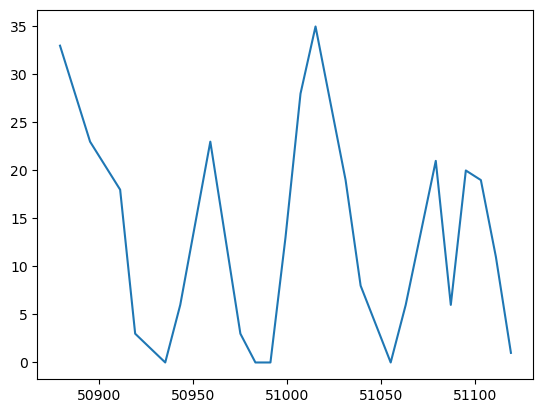

In [177]:
plt.plot([str2time(t) for t in sp_lou.msg_time], sp_lou.speed_mph)

In [197]:
def plot_speed2(trip, **kwargs):
#     times = [str2time(t) for t in sp_lou.msg_time]
    times = -(trip.longitude.to_numpy())
    plt.plot(times[:6], trip.speed_mph.iloc[:6], color='red', **kwargs)
    plt.plot(times[5:-5], trip.speed_mph.iloc[5:-5], color='blue', **kwargs)
    plt.plot(times[-6:], trip.speed_mph.iloc[-6:], color='red', **kwargs)
    

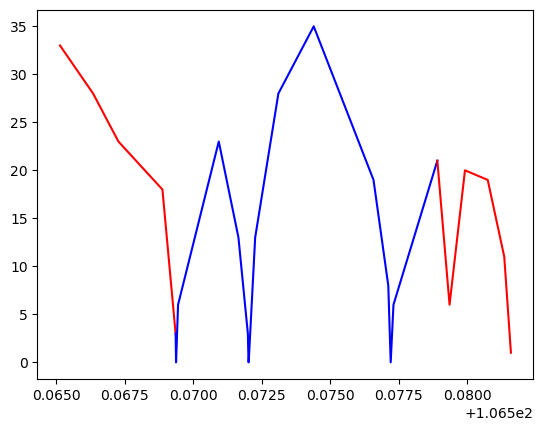

In [193]:
plot_speed2(sp_lou)

In [196]:
valid_wb_arts

['540222',
 '540226',
 '540228',
 '540215',
 '540217',
 '540216',
 '540207',
 '540214',
 '540238',
 '540234',
 '540224',
 '540240',
 '540236',
 '540227',
 '540221',
 '540218',
 '540235',
 '540223',
 '540275',
 '540212',
 '540210',
 '540225',
 '540203',
 '540239',
 '540211',
 '540205',
 '540199',
 '540243',
 '540231',
 '540237',
 '540208',
 '540229',
 '540204',
 '540230',
 '540206',
 '540209',
 '540219',
 '540242',
 '540232',
 '540241',
 '540213']

100%|██████████████████████████| 44/44 [00:30<00:00,  1.45it/s]


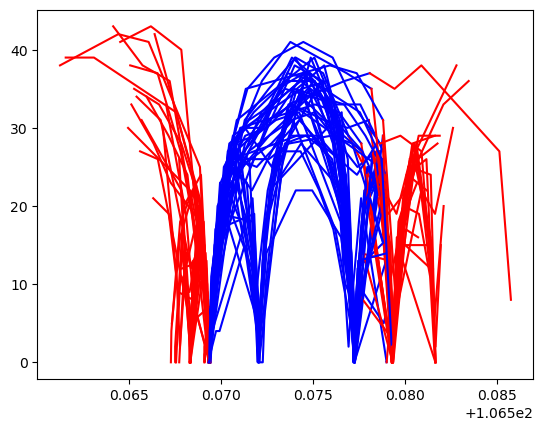

In [203]:
segments = []
for artid in tqdm(valid_eb_arts):
    art = df[df.trip_id == artid]
    segment = art_between(art, '704230858', '704230974')
    segments.append(segment)
    plot_speed2(segment)

In [204]:
## I could also just identify the spots where it stops
art_stops = []
for artid in tqdm(valid_eb_arts):
    art = df[df.trip_id == artid]
    art = art.iloc[np.argsort(art.msg_time)]
    prev_speed = 1
    for _,row in art.iterrows():
        if row.speed_mph == 0:
            if prev_speed == 0:
                duration += str2time(row.msg_time) - stop_start
                stop_start = str2time(row.msg_time)
                continue
            else:
                stop_start = str2time(row.msg_time)
                prev_speed = 0
                duration = 0
                stop_location = (row.latitude, row.longitude)
        else:
            if prev_speed == 0:
                art_stops.append( (stop_location, duration))
        prev_speed = row.speed_mph

100%|██████████████████████████| 44/44 [00:12<00:00,  3.54it/s]


In [206]:
len(art_stops)

1450

In [212]:
# filter by how close they are to real stops
real_artstop_locations = [ stoplocations[s] for s,v in stopnames.items() if 'ART' in v]
real_artstop_locations

[{'lat': 35.070248, 'lng': -106.51563300000001},
 {'lat': 35.072183, 'lng': -106.533424},
 {'lat': 35.074090000000005, 'lng': -106.55088799999999},
 {'lat': 35.066138, 'lng': -106.498065},
 {'lat': 35.073714, 'lng': -106.549733},
 {'lat': 35.071742, 'lng': -106.531578},
 {'lat': 35.069891, 'lng': -106.514582},
 {'lat': 35.080046, 'lng': -106.710101},
 {'lat': 35.082701, 'lng': -106.69833100000001},
 {'lat': 35.085698, 'lng': -106.685129},
 {'lat': 35.094381, 'lng': -106.669974},
 {'lat': 35.089636999999996, 'lng': -106.66428700000002},
 {'lat': 35.083228000000005, 'lng': -106.641049},
 {'lat': 35.082217, 'lng': -106.633021},
 {'lat': 35.081338, 'lng': -106.626478},
 {'lat': 35.081053000000004, 'lng': -106.62011799999999},
 {'lat': 35.0805, 'lng': -106.609602},
 {'lat': 35.078859, 'lng': -106.595652},
 {'lat': 35.077876, 'lng': -106.586646},
 {'lat': 35.075996, 'lng': -106.56932900000001},
 {'lat': 35.080003000000005, 'lng': -106.71013899999998},
 {'lat': 35.082669, 'lng': -106.698365},

In [214]:
# art_stops = [ dict(lat=a[0][0], lng=a[0][1], duration=a[1], dist_to_station=min(geopy.distance.geodesic())]
art_stop_info = []
for a in tqdm(art_stops):
    lat = a[0][0]
    lng = a[0][1]
    duration = a[1]
    dist_to_station = min([geopy.distance.geodesic((lat,lng), (b['lat'], b['lng'])).feet for b in real_artstop_locations])
    art_stop_info.append(dict(lat=lat, lng=lng, duration=duration, dist_to_station=dist_to_station))

100%|██████████████████████| 1450/1450 [00:25<00:00, 57.40it/s]


In [216]:
far_stops = [ a for a in art_stop_info if a['dist_to_station'] > 100 ]
len(far_stops)

692

In [232]:
# right, need to convert lat/lon to euclidean
origin_x = -106.544256
origin_y = 35.034674
foot_x = 1
d = geopy.distance.geodesic( (origin_y, origin_x), (origin_y, origin_x + foot_x)).feet
while abs(d-1) > 1e-5:
    if d > 1:
        foot_x *= 0.9
    else:
        foot_x *= 1.05
        
    d = geopy.distance.geodesic( (origin_y, origin_x), (origin_y, origin_x + foot_x)).feet
foot_y = 1
d = geopy.distance.geodesic( (origin_y, origin_x), (origin_y+foot_y, origin_x)).feet
while abs(d-1) > 1e-5:
    if d > 1:
        foot_y *= 0.9
    else:
        foot_y *= 1.05
    d = geopy.distance.geodesic( (origin_y, origin_x), (origin_y+foot_y, origin_x)).feet
    

In [234]:
def ll2euclid(ptx, pty):
    pt = np.array([ptx, pty])
    pt -= [origin_y, origin_x]
    pt /= [foot_y, foot_x]
    return pt

In [235]:
# do an agglomerative clustering with max affinity such that each cluster has a diameter at most 100 feet
# ag, order = autocluster([ (d['lat'], d['lng']) for d in far_stops], return_order=True, plot=True)
ag = AgglomerativeClustering(n_clusters=None, distance_threshold=100, linkage='complete')
ag.fit([ ll2euclid(d['lat'], d['lng']) for d in far_stops])

AgglomerativeClustering(distance_threshold=100, linkage='complete',
                        n_clusters=None)

In [237]:
max(ag.labels_)

88

  2%|▍                       | 12/692 [00:00<00:06, 108.38it/s]

loading image


100%|███████████████████████| 692/692 [00:03<00:00, 225.44it/s]


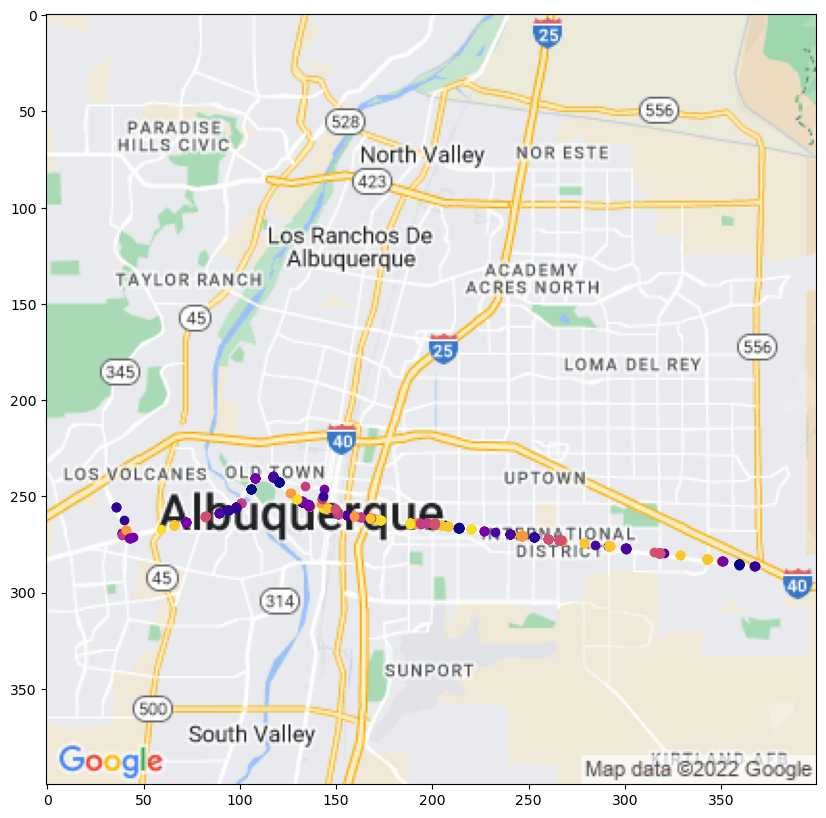

In [238]:
for i,stop in enumerate(tqdm(far_stops)):
    plot_abq([(stop['lat'], stop['lng'])], first=i==0, c=cm.plasma((ag.labels_[i] **2 % 17)/17))


In [242]:
# now find cluster centers and count total delay
cluster_groups = [[] for _ in range(ag.n_clusters_)]
for i,stop in enumerate(tqdm(far_stops)):
    cluster_groups[ag.labels_[i]].append(stop)

clusters = []
for i,gp in enumerate(tqdm(cluster_groups)):
    lat = np.mean([g['lat'] for g in gp])
    lng = np.mean([g['lng'] for g in gp])
    duration = sum([g['duration'] for g in gp])
    counts = len(gp)
    clusters.append( dict(lat=lat, lng=lng, duration=duration, counts=counts))

100%|██████████████████████████████████| 89/89 [00:00<?, ?it/s]


100%|█████████████████████████| 89/89 [00:00<00:00, 753.01it/s]


loading image


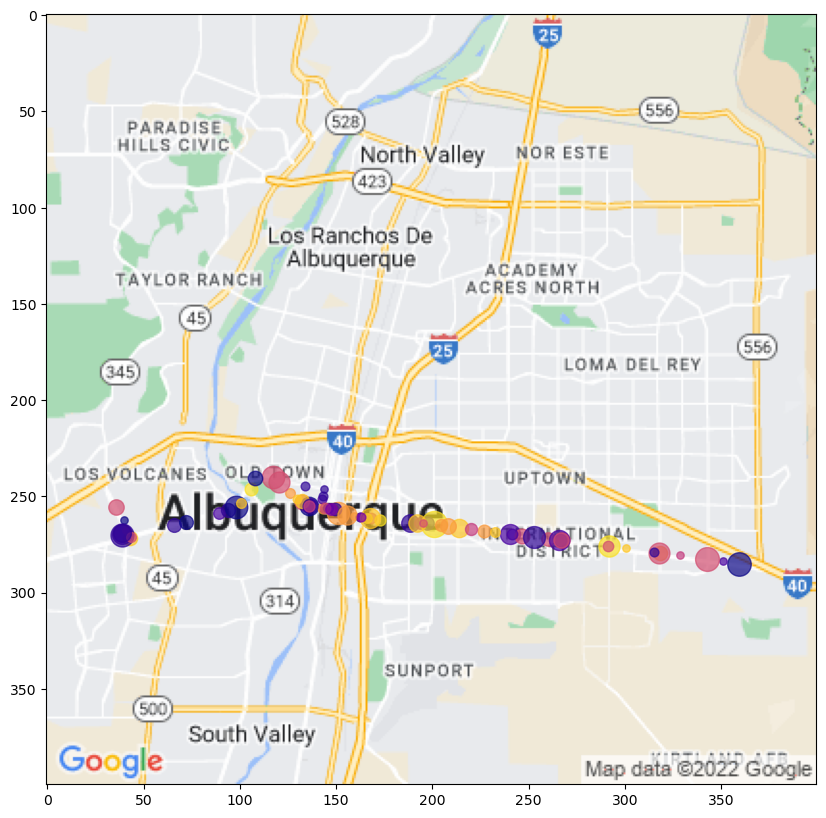

In [246]:
for i,cluster in enumerate(tqdm(clusters)):
    plot_abq([(cluster['lat'], cluster['lng'])], first=i==0, c=cm.plasma((ag.labels_[i] **2 % 17)/17), alpha=0.7, s=10*np.sqrt(cluster['duration']))


In [248]:
for i,cluster in enumerate(sorted(clusters, key=lambda x: -x['duration'])):
    print('Cluster ', i+1)
    print('\tLat: ', round(cluster['lat'],8), ' lon: ', round(cluster['lng'],8))
    print('\tTotal delay: ', cluster['duration']/60)
    print('\tNumber of stops: ', cluster['counts'])
    print()


Cluster  1
	Lat:  35.08094071  lon:  -106.61295721
	Total delay:  20.683333333333334
	Number of stops:  32

Cluster  2
	Lat:  35.07013964  lon:  -106.51489922
	Total delay:  14.4
	Number of stops:  21

Cluster  3
	Lat:  35.06857174  lon:  -106.50341971
	Total delay:  13.65
	Number of stops:  33

Cluster  4
	Lat:  35.0781388  lon:  -106.7252223
	Total delay:  12.583333333333334
	Number of stops:  1

Cluster  5
	Lat:  35.08598709  lon:  -106.68446223
	Total delay:  11.6
	Number of stops:  23

Cluster  6
	Lat:  35.09499054  lon:  -106.67117014
	Total delay:  11.333333333333334
	Number of stops:  25

Cluster  7
	Lat:  35.08407308  lon:  -106.64778863
	Total delay:  10.933333333333334
	Number of stops:  40

Cluster  8
	Lat:  35.07681118  lon:  -106.57723813
	Total delay:  10.266666666666667
	Number of stops:  25

Cluster  9
	Lat:  35.07396859  lon:  -106.5500802
	Total delay:  8.933333333333334
	Number of stops:  15

Cluster  10
	Lat:  35.09344668  lon:  -106.66880003
	Total delay:  8.66666